In [1]:
import pandas as pd
import numpy as np
import scanpy as sc
import anndata as ad
import os

import warnings
warnings.filterwarnings("ignore")

os.environ["CUDA_VISIBLE_DEVICES"] = "0"

import sys
sys.path.append(r'/import/home2/share/yqzeng/MacSGP/codes')
import MacSGP_additive

In [2]:
DATA_PATH = "/import/home2/share/yqzeng/MacSGP/data/Mouth_brain_visium" # Raw data
SAVE_PATH = "/import/home2/share/yqzeng/MacSGP/Results/Mouth_brain_visium" # Deconvolution results
os.makedirs(os.path.join(SAVE_PATH), exist_ok = True)

In [3]:
import torch    
model = torch.load(os.path.join(SAVE_PATH, "model_k=10_fix_gamma_k.pt"))

In [4]:
adata_result = model.eval(sort_sgps=False)

In [5]:
ct_plot= [#'Astro_HPC',
 #'Astro_HYPO',
 'Ext_Amy_2',
 'Ext_Hpc_CA1',
 'Ext_Hpc_CA3',
 'Ext_Hpc_DG1',
 'Ext_L23',
 'Ext_L5_1',
 'Ext_L5_2',
 #'Ext_L6',
 'Ext_Med',
 'Ext_Pir',
 'Ext_Thal_1',
 'Ext_Thal_2',
 'Inh_1',
 #'Inh_3'333,
 'Inh_4',
 #'Inh_Meis2_3',
 #'Oligo_1',
 #'Oligo_2']
 ]

In [6]:
variance_list = []
for ct in ct_plot:
    variation_ct = []
    for index in range(0, 11):
        variation = adata_result.obsm[ct].values[:, 0:index] @ adata_result.varm[ct].values[:, 0:index].T
        variation_ct.append((variation**2).mean())
    variance_ct = np.array(variation_ct)
    variance_ct = variance_ct / variance_ct[-1]
    variance_list.append(variance_ct)

# get increased variance from 1 to 10 SGPs
variance_explained = []
for variance_ct in variance_list:
    explained = variance_ct[1:] - variance_ct[:-1]
    variance_explained.append(explained)

# variance explained to dataframe
variance_explained_df = pd.DataFrame(variance_explained, index=ct_plot, columns=['SGP_{}'.format(i) for i in range(1, 11)])

In [33]:
basis = model.basis.detach().cpu().numpy()
gamma_k = model.net.gamma_k.detach().cpu().numpy()
basis = basis * np.exp(gamma_k)
proportion = model.proportion.detach().cpu().numpy()
u_exp = proportion @ basis
alpha = model.alpha.detach().cpu().numpy()
gamma = model.gamma.detach().cpu().numpy()
log_lam = np.log(u_exp + 1e-6) + alpha.reshape(-1, 1) + gamma.reshape(1, -1)
# compute decon_loss with log_lam
count = model.Y.detach().cpu().numpy()
library_size = count.sum(axis=1)
# decon_loss_null = - torch.mean(torch.sum(count * 
#                                         (torch.log(library_size + 1e-6) + log_lam) - library_size * torch.exp(log_lam), axis=1))
decon_loss_null = - np.mean(np.sum(count * (np.log(library_size.reshape(-1, 1) + 1e-6) + log_lam) - library_size.reshape(-1, 1) * np.exp(log_lam), axis=1))

# pick decon_loss for each round
decon_loss_all = model.decon_loss
decon_loss_ind = [decon_loss_all[i*3000-1] for i in range(1, 11)]
decon_loss_ind = [decon_loss_null] + decon_loss_ind
decon_loss_ind

[-6050.8916,
 -6130.259765625,
 -6152.9921875,
 -6168.91455078125,
 -6179.53076171875,
 -6186.35693359375,
 -6190.72021484375,
 -6195.12060546875,
 -6198.787109375,
 -6202.041015625,
 -6205.18798828125]

In [ ]:
import numpy as np
import pandas as pd

# ── Recompute full model quantities ──────────────────────────────────────────
basis_adj = model.basis.detach().cpu().numpy()                   # C x G
gamma_k_np = model.net.gamma_k.detach().cpu().numpy()            # C x G
basis_adj = basis_adj * np.exp(gamma_k_np)                       # C x G

proportion_np = model.proportion.detach().cpu().numpy()          # N x C
alpha_np = model.alpha.detach().cpu().numpy()                    # N
gamma_np = model.gamma.detach().cpu().numpy()                    # G (gene effects)
count_np = model.Y.detach().cpu().numpy()                        # N x G
library_size_np = count_np.sum(axis=1)                           # N

celltypes_all = list(adata_result.obsm['proportion'].columns)    # all C cell types

# ── Build u_exp for every cell type (N x G each) ─────────────────────────────
# u_exp_c = pi_nc * B_cg * exp(F_c @ L_c^T)
u_exp_dict = {}
for c_idx, ct in enumerate(celltypes_all):
    if ct in adata_result.obsm and isinstance(adata_result.obsm[ct], pd.DataFrame):
        F_c = adata_result.obsm[ct].values          # N x K
        L_c = adata_result.varm[ct].values          # G x K
        exp_factor = np.exp(F_c @ L_c.T)            # N x G
    else:
        N = proportion_np.shape[0]
        G = basis_adj.shape[1]
        exp_factor = np.ones((N, G))
    u_exp_dict[ct] = proportion_np[:, c_idx:c_idx+1] * basis_adj[c_idx:c_idx+1, :] * exp_factor

u_exp_total = sum(u_exp_dict.values())               # N x G

log_lam_full = (np.log(u_exp_total + 1e-6)
                + alpha_np.reshape(-1, 1)
                + gamma_np.reshape(1, -1))

def compute_nll(log_lam):
    return -np.mean(np.sum(
        count_np * (np.log(library_size_np.reshape(-1, 1) + 1e-6) + log_lam)
        - library_size_np.reshape(-1, 1) * np.exp(log_lam),
        axis=1))

nll_full = compute_nll(log_lam_full)
print(f"Full model NLL: {nll_full:.4f}")

# ── Leave-one-out: contribution of each (ct, k) ──────────────────────────────
# Removing SGP k from ct: u_exp_ct_new = u_exp_ct * exp(-f_ck * l_ck^T)

K = adata_result.obsm[ct_plot[0]].shape[1]
records = []

for ct in ct_plot:
    F_c = adata_result.obsm[ct].values    # N x K
    L_c = adata_result.varm[ct].values    # G x K

    for k in range(K):
        f_k = F_c[:, k]                   # N
        l_k = L_c[:, k]                   # G

        # u_exp without SGP k of ct
        adj = np.exp(-np.outer(f_k, l_k))                     # N x G
        u_exp_ct_new = u_exp_dict[ct] * adj                    # N x G

        u_exp_new = u_exp_total - u_exp_dict[ct] + u_exp_ct_new
        log_lam_new = (np.log(u_exp_new + 1e-6)
                       + alpha_np.reshape(-1, 1)
                       + gamma_np.reshape(1, -1))
        nll_new = compute_nll(log_lam_new)

        delta_nll = nll_new - nll_full     # positive = this SGP helps
        records.append({'cell_type': ct, 'SGP': k + 1, 'delta_nll': delta_nll})

contrib_df = pd.DataFrame(records)
total = contrib_df['delta_nll'].sum()
contrib_df['contribution_pct'] = contrib_df['delta_nll'] / total * 100

print(contrib_df.pivot(index='cell_type', columns='SGP', values='contribution_pct').round(2))

Full model NLL: -6205.2158
SGP             1     2     3     4     5     6     7     8     9     10
cell_type                                                               
Ext_Amy_2     2.50  1.18  0.68  0.53  0.44  0.42  0.39  0.38  0.36  0.28
Ext_Hpc_CA1   3.40  0.98  0.68  0.42  0.48  0.08  0.47  0.03  0.43  0.03
Ext_Hpc_CA3   2.15  0.44  0.29  0.27  0.02  0.30  0.03  0.02  0.02  0.01
Ext_Hpc_DG1   2.15  0.51  0.48  0.48  0.49  0.05  0.45  0.42  0.04  0.43
Ext_L23       2.06  0.93  0.83  0.66  0.62  0.56  0.52  0.52  0.49  0.49
Ext_L5_1      2.39  1.18  0.82  0.66  0.52  0.45  0.50  0.41  0.42  0.41
Ext_L5_2      0.51  0.42  0.27  0.22  0.06  0.01  0.01  0.00  0.00  0.00
Ext_Med       0.74  0.40  0.26  0.12  0.04  0.08  0.02  0.01  0.01  0.01
Ext_Pir       2.26  1.35  0.80  0.84  0.58  0.57  0.56  0.50  0.48  0.09
Ext_Thal_1    2.71  0.95  0.64  0.55  0.52  0.50  0.48  0.46  0.44  0.45
Ext_Thal_2    1.91  0.72  0.75  0.64  0.47  0.05  0.42  0.37  0.04  0.38
Inh_1         4.50  1.32

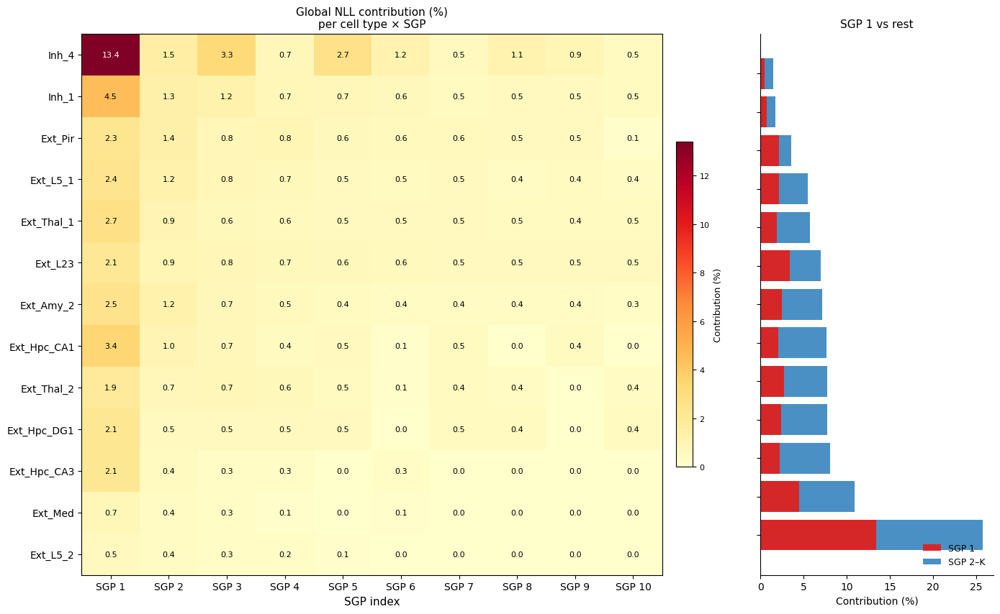

SGP 1 total contribution across all cell types: 40.7%
SGP 2 total: 11.9%
SGP 3 total: 11.0%


In [22]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import numpy as np

# ── Pivot to matrix: rows = cell types, cols = SGP 1..K ──────────────────────
pct_matrix = contrib_df.pivot(index='cell_type', columns='SGP', values='contribution_pct')

# Sort rows by total contribution (descending)
pct_matrix = pct_matrix.loc[pct_matrix.sum(axis=1).sort_values(ascending=False).index]

col_labels = [f'SGP {k}' for k in pct_matrix.columns]

fig, axes = plt.subplots(1, 2, figsize=(14, len(ct_plot) * 0.55 + 1.5),
                         gridspec_kw={'width_ratios': [3, 1]})

# ── Left: heatmap ─────────────────────────────────────────────────────────────
im = axes[0].imshow(pct_matrix.values, aspect='auto', cmap='YlOrRd')

axes[0].set_xticks(range(len(col_labels)))
axes[0].set_xticklabels(col_labels, fontsize=10)
axes[0].set_yticks(range(len(pct_matrix)))
axes[0].set_yticklabels(pct_matrix.index, fontsize=10)
axes[0].set_xlabel('SGP index', fontsize=11)
axes[0].set_title('Global NLL contribution (%)\nper cell type × SGP', fontsize=11)

# Annotate each cell with its value
for i in range(pct_matrix.shape[0]):
    for j in range(pct_matrix.shape[1]):
        val = pct_matrix.values[i, j]
        color = 'white' if val > pct_matrix.values.max() * 0.6 else 'black'
        axes[0].text(j, i, f'{val:.1f}', ha='center', va='center',
                     fontsize=8, color=color)

cbar = fig.colorbar(im, ax=axes[0], shrink=0.6, pad=0.02)
cbar.set_label('Contribution (%)', fontsize=9)
cbar.ax.tick_params(labelsize=8)

# ── Right: stacked bar — SGP1 vs rest per cell type ───────────────────────────
sgp1 = pct_matrix.iloc[:, 0].values
rest = pct_matrix.iloc[:, 1:].values.sum(axis=1)
y = np.arange(len(pct_matrix))

axes[1].barh(y, sgp1, color='#d62728', label='SGP 1')
axes[1].barh(y, rest, left=sgp1, color='#4a90c4', label='SGP 2–K')
axes[1].set_yticks(y)
axes[1].set_yticklabels([])
axes[1].set_xlabel('Contribution (%)', fontsize=10)
axes[1].set_title('SGP 1 vs rest', fontsize=11)
axes[1].legend(fontsize=9, frameon=False, loc='lower right')
axes[1].spines['top'].set_visible(False)
axes[1].spines['right'].set_visible(False)

plt.tight_layout()
# plt.savefig('global_contribution_heatmap.pdf', dpi=300, bbox_inches='tight')
plt.show()

# ── Summary stats ──────────────────────────────────────────────────────────────
sgp1_total = pct_matrix.iloc[:, 0].sum()
print(f"SGP 1 total contribution across all cell types: {sgp1_total:.1f}%")
print(f"SGP 2 total: {pct_matrix.iloc[:, 1].sum():.1f}%")
print(f"SGP 3 total: {pct_matrix.iloc[:, 2].sum():.1f}%")

In [23]:
import numpy as np

# ── 诊断：找出贡献异常大的 (ct, k)，分析原因 ────────────────────────────────

# 找 top 5 贡献
top5 = contrib_df.nlargest(5, 'delta_nll')[['cell_type', 'SGP', 'delta_nll', 'contribution_pct']]
print("Top 5 (cell type, SGP) by global NLL contribution:")
print(top5.to_string(index=False))
print()

# 对每个 (ct, k)，打印以下诊断信息：
# 1. mean proportion of that cell type
# 2. std of factor scores (spatial variability)
# 3. norm of loading (gene effect magnitude)
# 4. max |exp(f * l)| - how extreme the multiplicative factor gets
print(f"{'cell_type':<18} {'SGP':>4} {'mean_prop':>10} {'std_factor':>11} {'loading_norm':>13} {'max_exp_fl':>11}")
print("-" * 72)
for _, row in top5.iterrows():
    ct   = row['cell_type']
    k    = int(row['SGP']) - 1
    c_idx = celltypes_all.index(ct)

    mean_prop   = proportion_np[:, c_idx].mean()
    f_k         = adata_result.obsm[ct].values[:, k]
    l_k         = adata_result.varm[ct].values[:, k]
    std_factor  = f_k.std()
    loading_norm = np.linalg.norm(l_k)
    fl           = np.outer(f_k, l_k)          # N x G
    max_exp_fl   = np.exp(fl).max()

    print(f"{ct:<18} {k+1:>4} {mean_prop:>10.4f} {std_factor:>11.4f} {loading_norm:>13.4f} {max_exp_fl:>11.2f}")

print()
print("Interpretation:")
print("  mean_prop   : average cell type proportion across spots")
print("  std_factor  : spatial variability of factor scores (how much the SGP varies)")
print("  loading_norm: magnitude of gene loadings (how many/large genes are affected)")
print("  max_exp_fl  : max multiplicative amplification exp(f*l^T) — if >> 1, the SGP")
print("                creates extreme expression changes in some spots")

Top 5 (cell type, SGP) by global NLL contribution:
  cell_type  SGP  delta_nll  contribution_pct
      Inh_4    1  12.163086         13.391177
      Inh_1    1   4.091309          4.504403
Ext_Hpc_CA1    1   3.091309          3.403434
      Inh_4    3   2.990723          3.292692
 Ext_Thal_1    1   2.458496          2.706728

cell_type           SGP  mean_prop  std_factor  loading_norm  max_exp_fl
------------------------------------------------------------------------
Inh_4                 1     0.0404      0.1308       10.4059       21.32
Inh_1                 1     0.0447      0.1832       15.5396       13.65
Ext_Hpc_CA1           1     0.0378      0.1053        9.7409        2.01
Inh_4                 3     0.0404      0.1179        9.3033        3.04
Ext_Thal_1            1     0.0854      0.1521       12.6763        4.52

Interpretation:
  mean_prop   : average cell type proportion across spots
  std_factor  : spatial variability of factor scores (how much the SGP varies)
  loadi

Proportion-weighted log-space contribution (%) per cell type × SGP:
SGP            1     2     3     4     5     6     7     8     9     10
cell_type                                                              
Inh_1        8.04  2.37  2.03  1.11  0.92  0.71  0.45  0.54  0.59  0.56
Ext_Thal_1   5.36  1.88  1.00  0.91  0.74  0.85  0.77  0.70  0.66  0.70
Ext_L23      3.40  0.97  1.14  0.86  0.87  0.69  0.64  0.64  0.62  0.56
Ext_L5_1     3.54  1.65  1.08  0.86  0.55  0.47  0.54  0.42  0.44  0.42
Ext_Thal_2   4.02  1.13  1.25  1.24  0.73  0.02  0.56  0.45  0.01  0.46
Inh_4        2.51  1.06  1.22  0.94  0.75  0.19  0.71  0.52  0.58  0.55
Ext_Amy_2    3.39  1.62  0.84  0.53  0.37  0.36  0.35  0.35  0.26  0.16
Ext_Pir      2.60  1.27  0.74  0.81  0.50  0.54  0.48  0.41  0.35  0.04
Ext_Hpc_CA1  1.48  1.22  0.73  0.46  0.44  0.03  0.44  0.01  0.40  0.01
Ext_Hpc_DG1  1.19  0.53  0.50  0.51  0.45  0.02  0.41  0.37  0.01  0.41
Ext_Hpc_CA3  0.71  0.33  0.23  0.19  0.00  0.22  0.00  0.00  0.00  0

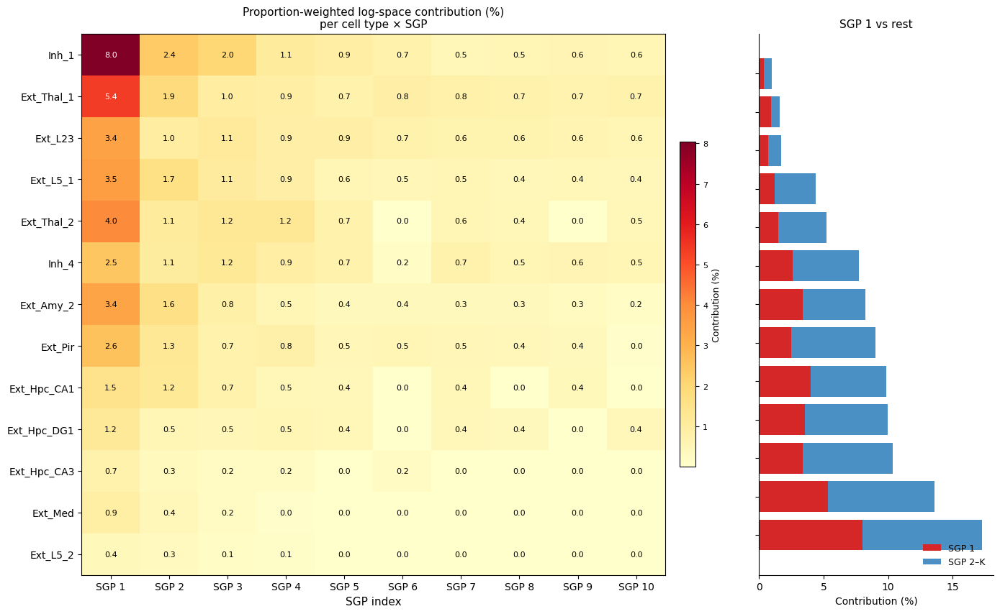

In [24]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ── Proportion-weighted variance in log-space ─────────────────────────────────
#
# In the multiplicative model, the marginal effect of SGP k of cell type c
# on the predicted log-expression is (first-order):
#
#   Δlog_lam_ng ≈ w_cng · f_nck · l_cgk
#
# where w_cng = u_exp_c[n,g] / u_exp_total[n,g]  (weight of cell type c)
#
# We use mean( (w_c · f_k · l_k^T)^2 ) as the contribution metric.
# This is independent of other SGPs and captures both:
#   - the spatial variability of f_k
#   - the gene specificity of l_k
#   - the actual importance of cell type c at each spot/gene

K = adata_result.obsm[ct_plot[0]].shape[1]
records_weighted = []

for ct in ct_plot:
    c_idx = celltypes_all.index(ct)
    w_c = u_exp_dict[ct] / (u_exp_total + 1e-6)   # N x G, weight of ct

    F_c = adata_result.obsm[ct].values             # N x K
    L_c = adata_result.varm[ct].values             # G x K

    for k in range(K):
        f_k  = F_c[:, k]                           # N
        l_k  = L_c[:, k]                           # G
        fl_k = np.outer(f_k, l_k)                  # N x G (log-space SGP contribution)

        # Weighted mean squared effective perturbation
        contrib = (w_c * fl_k ** 2).mean()
        records_weighted.append({'cell_type': ct, 'SGP': k + 1, 'contrib': contrib})

wt_df = pd.DataFrame(records_weighted)
total_wt = wt_df['contrib'].sum()
wt_df['contribution_pct'] = wt_df['contrib'] / total_wt * 100

pct_wt = wt_df.pivot(index='cell_type', columns='SGP', values='contribution_pct')
pct_wt = pct_wt.loc[pct_wt.sum(axis=1).sort_values(ascending=False).index]

print("Proportion-weighted log-space contribution (%) per cell type × SGP:")
print(pct_wt.round(2).to_string())
print()
print(f"SGP 1 total across all cell types: {pct_wt.iloc[:, 0].sum():.1f}%")

# ── Heatmap ───────────────────────────────────────────────────────────────────
col_labels = [f'SGP {k}' for k in pct_wt.columns]
fig, axes = plt.subplots(1, 2, figsize=(14, len(ct_plot) * 0.55 + 1.5),
                         gridspec_kw={'width_ratios': [3, 1]})

im = axes[0].imshow(pct_wt.values, aspect='auto', cmap='YlOrRd')
axes[0].set_xticks(range(len(col_labels)))
axes[0].set_xticklabels(col_labels, fontsize=10)
axes[0].set_yticks(range(len(pct_wt)))
axes[0].set_yticklabels(pct_wt.index, fontsize=10)
axes[0].set_xlabel('SGP index', fontsize=11)
axes[0].set_title('Proportion-weighted log-space contribution (%)\nper cell type × SGP', fontsize=11)

for i in range(pct_wt.shape[0]):
    for j in range(pct_wt.shape[1]):
        val = pct_wt.values[i, j]
        color = 'white' if val > pct_wt.values.max() * 0.6 else 'black'
        axes[0].text(j, i, f'{val:.1f}', ha='center', va='center',
                     fontsize=8, color=color)

cbar = fig.colorbar(im, ax=axes[0], shrink=0.6, pad=0.02)
cbar.set_label('Contribution (%)', fontsize=9)
cbar.ax.tick_params(labelsize=8)

sgp1 = pct_wt.iloc[:, 0].values
rest = pct_wt.iloc[:, 1:].values.sum(axis=1)
y = np.arange(len(pct_wt))
axes[1].barh(y, sgp1, color='#d62728', label='SGP 1')
axes[1].barh(y, rest, left=sgp1, color='#4a90c4', label='SGP 2–K')
axes[1].set_yticks(y)
axes[1].set_yticklabels([])
axes[1].set_xlabel('Contribution (%)', fontsize=10)
axes[1].set_title('SGP 1 vs rest', fontsize=11)
axes[1].legend(fontsize=9, frameon=False, loc='lower right')
axes[1].spines['top'].set_visible(False)
axes[1].spines['right'].set_visible(False)

plt.tight_layout()
# plt.savefig('weighted_contribution_heatmap.pdf', dpi=300, bbox_inches='tight')
plt.show()

In [47]:
u_base_total.shape

(4168, 6415)

In [50]:
delta_norm.shape

(4168, 6415)

Expression-space contribution (%) per cell type × SGP:
SGP             1     2     3     4     5     6     7     8     9     10
cell_type                                                               
Inh_1        10.63  1.92  1.92  0.92  0.75  0.55  0.33  0.68  0.49  0.47
Ext_Thal_1    5.59  1.94  0.91  0.91  0.76  0.86  0.81  0.74  0.71  0.74
Inh_4         4.27  1.19  1.25  0.96  0.78  0.20  0.84  0.56  0.62  0.67
Ext_Thal_2    4.17  1.00  1.17  1.22  0.73  0.02  0.56  0.46  0.01  0.45
Ext_L23       2.82  0.69  0.98  0.74  0.82  0.64  0.59  0.58  0.61  0.52
Ext_Pir       2.87  1.23  0.72  0.69  0.53  0.49  0.43  0.42  0.35  0.03
Ext_L5_1      2.87  1.18  0.83  0.67  0.37  0.37  0.40  0.32  0.39  0.35
Ext_Amy_2     3.14  1.26  0.64  0.39  0.31  0.30  0.28  0.26  0.19  0.12
Ext_Hpc_CA1   1.59  1.41  0.84  0.55  0.52  0.03  0.53  0.01  0.49  0.01
Ext_Hpc_DG1   1.28  0.65  0.64  0.65  0.56  0.02  0.53  0.45  0.01  0.51
Ext_Hpc_CA3   0.65  0.33  0.22  0.20  0.00  0.23  0.00  0.00  0.00  0

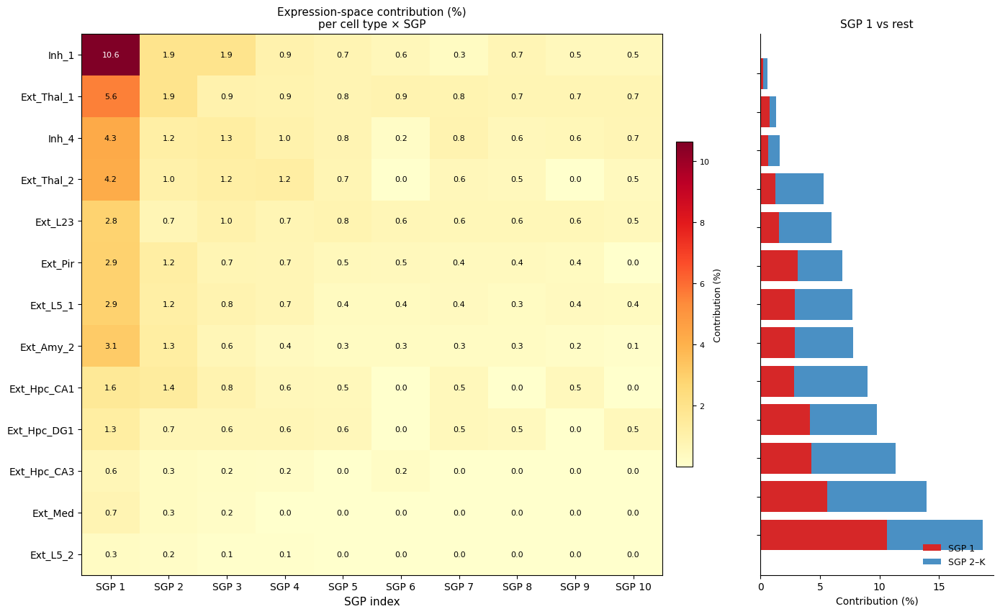

In [27]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ── Expression-space contribution weighted by reference expression ────────────
#
# For SGP k of cell type c, the change in predicted expression relative
# to the no-SGP baseline is:
#
#   Δu_cng = π_nc · B_cg · (exp(f_nck · l_cgk) − 1)
#
# Normalized by total baseline expression Σ_c π_nc · B_cg:
#
#   δ_cng = Δu_cng / u_base_total
#
# contribution(c,k) = mean_n,g( δ_cng² )
#
# This is fully expression-space (no log approximation), uses reference
# expression B_cg as the weight, and is independent of other SGPs.

# ── Baseline expression: π_nc · B_cg, no SGP ─────────────────────────────────
u_base_dict = {}
for c_idx, ct in enumerate(celltypes_all):
    u_base_dict[ct] = (proportion_np[:, c_idx:c_idx+1]
                       * basis_adj[c_idx:c_idx+1, :])   # N x G

u_base_total = sum(u_base_dict.values())                 # N x G

# ── Compute contribution per (ct, k) ─────────────────────────────────────────
K = adata_result.obsm[ct_plot[0]].shape[1]
records_expr = []

for ct in ct_plot:
    u_base_c = u_base_dict[ct]                           # N x G
    F_c = adata_result.obsm[ct].values                   # N x K
    L_c = adata_result.varm[ct].values                   # G x K

    for k in range(K):
        f_k  = F_c[:, k]                                 # N
        l_k  = L_c[:, k]                                 # G

        # Expression-space SGP effect: B_cg * π_nc * (exp(fl) - 1)
        fl_k    = np.outer(f_k, l_k)                     # N x G
        delta_u = u_base_c * (np.exp(fl_k) - 1)         # N x G

        # Normalized by total baseline expression
        delta_norm = delta_u / (u_base_total + 1e-6)     # N x G

        contrib = (delta_norm ** 2).mean()
        records_expr.append({'cell_type': ct, 'SGP': k + 1, 'contrib': contrib})

expr_df = pd.DataFrame(records_expr)
total_expr = expr_df['contrib'].sum()
expr_df['contribution_pct'] = expr_df['contrib'] / total_expr * 100

pct_expr = expr_df.pivot(index='cell_type', columns='SGP', values='contribution_pct')
pct_expr = pct_expr.loc[pct_expr.sum(axis=1).sort_values(ascending=False).index]

print("Expression-space contribution (%) per cell type × SGP:")
print(pct_expr.round(2).to_string())
print()
print(f"SGP 1 total across all cell types: {pct_expr.iloc[:, 0].sum():.1f}%")
print(f"SGP 2 total: {pct_expr.iloc[:, 1].sum():.1f}%")
print(f"SGP 3 total: {pct_expr.iloc[:, 2].sum():.1f}%")

# ── Heatmap ───────────────────────────────────────────────────────────────────
col_labels = [f'SGP {k}' for k in pct_expr.columns]
fig, axes = plt.subplots(1, 2, figsize=(14, len(ct_plot) * 0.55 + 1.5),
                         gridspec_kw={'width_ratios': [3, 1]})

im = axes[0].imshow(pct_expr.values, aspect='auto', cmap='YlOrRd')
axes[0].set_xticks(range(len(col_labels)))
axes[0].set_xticklabels(col_labels, fontsize=10)
axes[0].set_yticks(range(len(pct_expr)))
axes[0].set_yticklabels(pct_expr.index, fontsize=10)
axes[0].set_xlabel('SGP index', fontsize=11)
axes[0].set_title('Expression-space contribution (%)\nper cell type × SGP', fontsize=11)

for i in range(pct_expr.shape[0]):
    for j in range(pct_expr.shape[1]):
        val = pct_expr.values[i, j]
        color = 'white' if val > pct_expr.values.max() * 0.6 else 'black'
        axes[0].text(j, i, f'{val:.1f}', ha='center', va='center',
                     fontsize=8, color=color)

cbar = fig.colorbar(im, ax=axes[0], shrink=0.6, pad=0.02)
cbar.set_label('Contribution (%)', fontsize=9)
cbar.ax.tick_params(labelsize=8)

sgp1 = pct_expr.iloc[:, 0].values
rest = pct_expr.iloc[:, 1:].values.sum(axis=1)
y = np.arange(len(pct_expr))
axes[1].barh(y, sgp1, color='#d62728', label='SGP 1')
axes[1].barh(y, rest, left=sgp1, color='#4a90c4', label='SGP 2–K')
axes[1].set_yticks(y)
axes[1].set_yticklabels([])
axes[1].set_xlabel('Contribution (%)', fontsize=10)
axes[1].set_title('SGP 1 vs rest', fontsize=11)
axes[1].legend(fontsize=9, frameon=False, loc='lower right')
axes[1].spines['top'].set_visible(False)
axes[1].spines['right'].set_visible(False)

plt.tight_layout()
# plt.savefig('expr_contribution_heatmap.pdf', dpi=300, bbox_inches='tight')
plt.show()

Spot-level expression contribution (%) per cell type × SGP:
SGP             1     2     3     4     5     6     7     8     9     10
cell_type                                                               
Ext_Thal_1   14.35  4.26  2.84  3.40  2.17  2.45  1.87  1.98  2.12  1.47
Ext_Thal_2    8.93  3.73  4.23  3.61  1.30  0.07  1.19  1.03  0.04  1.32
Ext_L23       1.70  2.01  0.99  0.58  0.41  0.30  0.39  0.51  0.50  0.52
Inh_4         2.06  1.01  1.29  0.91  0.49  0.17  0.34  0.40  0.48  0.42
Ext_L5_1      1.65  0.71  0.76  0.50  0.86  0.33  0.37  0.35  0.25  0.33
Inh_1         2.11  1.19  0.48  0.32  0.38  0.28  0.14  0.15  0.22  0.19
Ext_Hpc_CA1   1.37  0.34  0.26  0.08  0.09  0.02  0.10  0.00  0.11  0.00
Ext_Pir       0.94  0.26  0.26  0.23  0.07  0.16  0.08  0.08  0.04  0.01
Ext_Hpc_DG1   1.20  0.10  0.14  0.11  0.10  0.01  0.11  0.11  0.00  0.12
Ext_Amy_2     0.84  0.40  0.20  0.11  0.08  0.09  0.08  0.09  0.05  0.04
Ext_Med       1.06  0.23  0.12  0.02  0.01  0.01  0.00  0.00  0.

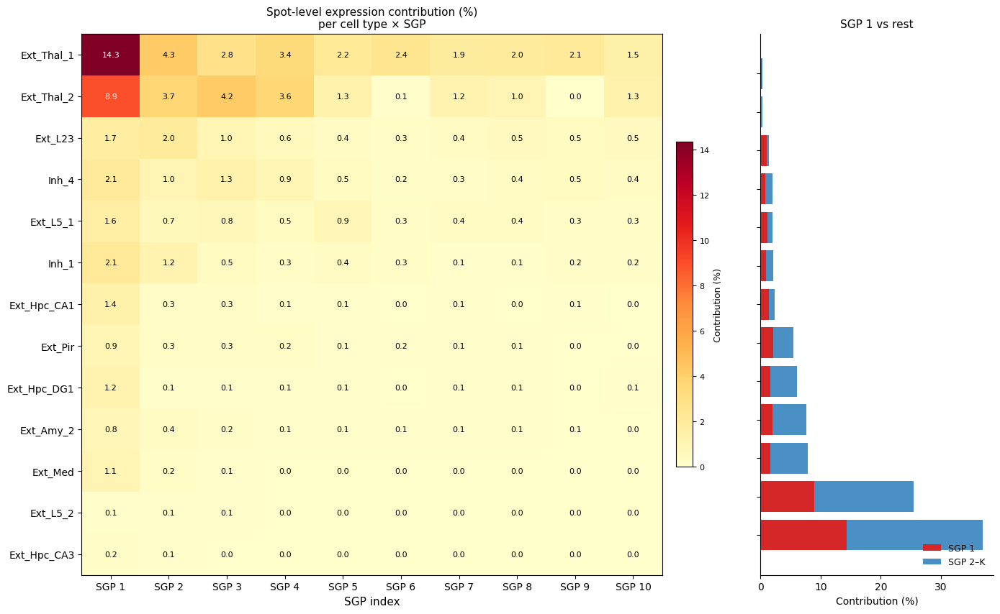

In [28]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ── Expression-space contribution, spot-level normalization ───────────────────
#
# Per-(spot, gene) normalization by u_base_total can blow up for lowly
# expressed genes. Instead, sum over genes first, then normalize by
# library size l_Y_n (total counts per spot):
#
#   δ_cn = Σ_g [ π_nc · B_cg · (exp(f_nck · l_cgk) − 1) ] / l_Y_n
#
# contribution(c,k) = mean_n( δ_cn² )
#
# Interpretation: fraction of a spot's total expression modulated by (c,k).
# Denominator is library size which is always >> 0, so numerically stable.

K = adata_result.obsm[ct_plot[0]].shape[1]
records_stable = []

for ct in ct_plot:
    c_idx    = celltypes_all.index(ct)
    u_base_c = u_base_dict[ct]                   # N x G  (π_nc · B_cg)
    F_c      = adata_result.obsm[ct].values       # N x K
    L_c      = adata_result.varm[ct].values       # G x K

    for k in range(K):
        f_k  = F_c[:, k]                          # N
        l_k  = L_c[:, k]                          # G

        fl_k    = np.outer(f_k, l_k)              # N x G
        delta_u = u_base_c * (np.exp(fl_k) - 1)  # N x G, expression-space change

        # Sum over genes → spot-level change, then normalize by library size
        delta_spot = np.abs(delta_u).sum(axis=1)                          # N
        delta_norm = delta_spot / (library_size_np + 1e-6)        # N

        contrib = (delta_norm ** 2).mean()
        records_stable.append({'cell_type': ct, 'SGP': k + 1, 'contrib': contrib})

stable_df = pd.DataFrame(records_stable)
total_s = stable_df['contrib'].sum()
stable_df['contribution_pct'] = stable_df['contrib'] / total_s * 100

pct_stable = stable_df.pivot(index='cell_type', columns='SGP', values='contribution_pct')
pct_stable = pct_stable.loc[pct_stable.sum(axis=1).sort_values(ascending=False).index]

print("Spot-level expression contribution (%) per cell type × SGP:")
print(pct_stable.round(2).to_string())
print()
print(f"SGP 1 total: {pct_stable.iloc[:, 0].sum():.1f}%")
print(f"SGP 2 total: {pct_stable.iloc[:, 1].sum():.1f}%")
print(f"SGP 3 total: {pct_stable.iloc[:, 2].sum():.1f}%")

# ── Heatmap ───────────────────────────────────────────────────────────────────
col_labels = [f'SGP {k}' for k in pct_stable.columns]
fig, axes = plt.subplots(1, 2, figsize=(14, len(ct_plot) * 0.55 + 1.5),
                         gridspec_kw={'width_ratios': [3, 1]})

im = axes[0].imshow(pct_stable.values, aspect='auto', cmap='YlOrRd')
axes[0].set_xticks(range(len(col_labels)))
axes[0].set_xticklabels(col_labels, fontsize=10)
axes[0].set_yticks(range(len(pct_stable)))
axes[0].set_yticklabels(pct_stable.index, fontsize=10)
axes[0].set_xlabel('SGP index', fontsize=11)
axes[0].set_title('Spot-level expression contribution (%)\nper cell type × SGP', fontsize=11)

for i in range(pct_stable.shape[0]):
    for j in range(pct_stable.shape[1]):
        val = pct_stable.values[i, j]
        color = 'white' if val > pct_stable.values.max() * 0.6 else 'black'
        axes[0].text(j, i, f'{val:.1f}', ha='center', va='center',
                     fontsize=8, color=color)

cbar = fig.colorbar(im, ax=axes[0], shrink=0.6, pad=0.02)
cbar.set_label('Contribution (%)', fontsize=9)
cbar.ax.tick_params(labelsize=8)

sgp1 = pct_stable.iloc[:, 0].values
rest = pct_stable.iloc[:, 1:].values.sum(axis=1)
y = np.arange(len(pct_stable))
axes[1].barh(y, sgp1, color='#d62728', label='SGP 1')
axes[1].barh(y, rest, left=sgp1, color='#4a90c4', label='SGP 2–K')
axes[1].set_yticks(y)
axes[1].set_yticklabels([])
axes[1].set_xlabel('Contribution (%)', fontsize=10)
axes[1].set_title('SGP 1 vs rest', fontsize=11)
axes[1].legend(fontsize=9, frameon=False, loc='lower right')
axes[1].spines['top'].set_visible(False)
axes[1].spines['right'].set_visible(False)

plt.tight_layout()
# plt.savefig('stable_contribution_heatmap.pdf', dpi=300, bbox_inches='tight')
plt.show()

Within-celltype normalized ΔNLL (row sums to 1):
SGP             1      2      3      4      5      6      7      8      9      10
cell_type                                                                        
Ext_Amy_2    0.349  0.169  0.095  0.073  0.060  0.058  0.054  0.053  0.049  0.039
Ext_Hpc_CA1  0.514  0.141  0.087  0.061  0.063  0.010  0.061  0.004  0.056  0.004
Ext_Hpc_CA3  0.603  0.127  0.085  0.079  0.006  0.080  0.006  0.006  0.005  0.002
Ext_Hpc_DG1  0.419  0.093  0.084  0.083  0.083  0.008  0.077  0.072  0.007  0.074
Ext_L23      0.294  0.104  0.108  0.087  0.079  0.071  0.066  0.066  0.063  0.063
Ext_L5_1     0.331  0.154  0.103  0.081  0.062  0.056  0.061  0.050  0.052  0.050
Ext_L5_2     0.359  0.279  0.174  0.140  0.032  0.007  0.006  0.000  0.001  0.002
Ext_Med      0.403  0.279  0.148  0.069  0.026  0.049  0.012  0.006  0.005  0.004
Ext_Pir      0.300  0.165  0.097  0.101  0.072  0.069  0.061  0.062  0.061  0.012
Ext_Thal_1   0.351  0.123  0.082  0.072  0.067  0

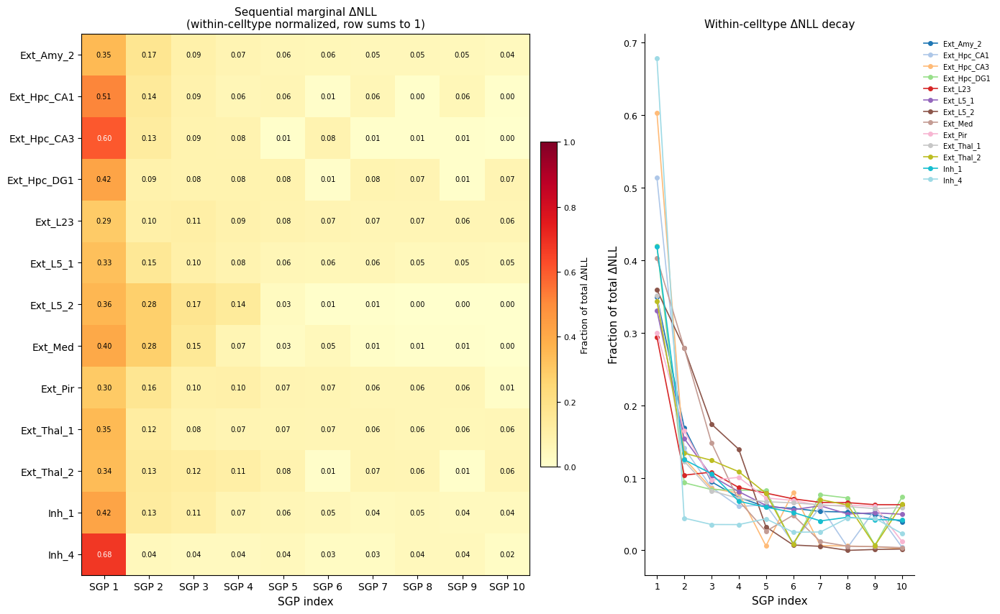


SGP-1 fraction of each celltype's total ΔNLL:
cell_type
Ext_Amy_2      0.349
Ext_Hpc_CA1    0.514
Ext_Hpc_CA3    0.603
Ext_Hpc_DG1    0.419
Ext_L23        0.294
Ext_L5_1       0.331
Ext_L5_2       0.359
Ext_Med        0.403
Ext_Pir        0.300
Ext_Thal_1     0.351
Ext_Thal_2     0.343
Inh_1          0.419
Inh_4          0.679

Mean SGP-1 fraction: 0.413


In [37]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ── Sequential marginal NLL contribution per (ct, k) ────────────────────────
#
# For each SGP round k (1..K), the baseline is the model with ALL cell types
# having exactly k-1 SGPs.  The marginal contribution of cell type ct at
# round k is the NLL drop when ct's k-th SGP is added on top of that baseline.

# ── Ensure prerequisites are available ──────────────────────────────────────
if 'celltypes_all' not in dir():
    basis_adj = model.basis.detach().cpu().numpy()
    gamma_k_np = model.net.gamma_k.detach().cpu().numpy()
    basis_adj = basis_adj * np.exp(gamma_k_np)
    proportion_np = model.proportion.detach().cpu().numpy()
    alpha_np = model.alpha.detach().cpu().numpy()
    gamma_np = model.gamma.detach().cpu().numpy()
    count_np = model.Y.detach().cpu().numpy()
    library_size_np = count_np.sum(axis=1)
    celltypes_all = list(adata_result.obsm['proportion'].columns)

    def compute_nll(log_lam):
        return -np.mean(np.sum(
            count_np * (np.log(library_size_np.reshape(-1, 1) + 1e-6) + log_lam)
            - library_size_np.reshape(-1, 1) * np.exp(log_lam),
            axis=1))

if 'u_base_dict' not in dir():
    u_base_dict = {}
    for c_idx, ct_i in enumerate(celltypes_all):
        u_base_dict[ct_i] = (proportion_np[:, c_idx:c_idx+1]
                             * basis_adj[c_idx:c_idx+1, :])

K = adata_result.obsm[ct_plot[0]].shape[1]

# ── Step 1: precompute u_exp_c_at_k[ct][k] ──────────────────────────────────
u_exp_c_at_k = {}
for ct_i in celltypes_all:
    u_base_c = u_base_dict[ct_i]
    u_exp_c_at_k[ct_i] = {0: u_base_c.copy()}
    if ct_i in adata_result.obsm and isinstance(adata_result.obsm[ct_i], pd.DataFrame):
        F_c = adata_result.obsm[ct_i].values
        L_c = adata_result.varm[ct_i].values
        for k in range(1, K + 1):
            u_exp_c_at_k[ct_i][k] = u_base_c * np.exp(F_c[:, :k] @ L_c[:, :k].T)
    else:
        for k in range(1, K + 1):
            u_exp_c_at_k[ct_i][k] = u_base_c.copy()

# ── Step 2: precompute u_total_at_k[k] ──────────────────────────────────────
u_total_at_k = {}
for k in range(K + 1):
    u_total_at_k[k] = sum(u_exp_c_at_k[ct_i][k] for ct_i in celltypes_all)

# ── Step 3: sequential marginal NLL per (ct, k) ─────────────────────────────
records_seq = []
for k in range(1, K + 1):
    u_base_k = u_total_at_k[k - 1]
    log_lam_base = (np.log(u_base_k + 1e-6)
                    + alpha_np.reshape(-1, 1)
                    + gamma_np.reshape(1, -1))
    nll_base = compute_nll(log_lam_base)

    for ct_i in ct_plot:
        u_new = (u_base_k
                 - u_exp_c_at_k[ct_i][k - 1]
                 + u_exp_c_at_k[ct_i][k])
        log_lam_new = (np.log(u_new + 1e-6)
                       + alpha_np.reshape(-1, 1)
                       + gamma_np.reshape(1, -1))
        nll_new = compute_nll(log_lam_new)
        delta_nll = nll_base - nll_new
        records_seq.append({'cell_type': ct_i, 'SGP': k, 'delta_nll': delta_nll})

seq_df = pd.DataFrame(records_seq)

# Raw matrix
delta_matrix = seq_df.pivot(index='cell_type', columns='SGP', values='delta_nll')

# Within-celltype normalization: each row sums to 1
delta_norm = delta_matrix.div(delta_matrix.sum(axis=1), axis=0)

# Keep original ct_plot order
delta_norm = delta_norm.loc[ct_plot]
delta_matrix = delta_matrix.loc[ct_plot]

print("Within-celltype normalized ΔNLL (row sums to 1):")
print(delta_norm.round(3).to_string())

# ── Visualization ─────────────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(14, len(ct_plot) * 0.55 + 1.5),
                         gridspec_kw={'width_ratios': [2, 1]})

# Left: heatmap
col_labels = [f'SGP {k}' for k in delta_norm.columns]
im = axes[0].imshow(delta_norm.values, aspect='auto', cmap='YlOrRd', vmin=0, vmax=1)
axes[0].set_xticks(range(len(col_labels)))
axes[0].set_xticklabels(col_labels, fontsize=10)
axes[0].set_yticks(range(len(delta_norm)))
axes[0].set_yticklabels(delta_norm.index, fontsize=10)
axes[0].set_xlabel('SGP index', fontsize=11)
axes[0].set_title('Sequential marginal ΔNLL\n(within-celltype normalized, row sums to 1)', fontsize=11)

for i in range(delta_norm.shape[0]):
    for j in range(delta_norm.shape[1]):
        val = delta_norm.values[i, j]
        color = 'white' if val > 0.6 else 'black'
        axes[0].text(j, i, f'{val:.2f}', ha='center', va='center',
                     fontsize=7, color=color)

cbar = fig.colorbar(im, ax=axes[0], shrink=0.6, pad=0.02)
cbar.set_label('Fraction of total ΔNLL', fontsize=9)
cbar.ax.tick_params(labelsize=8)

# Right: line plot
cmap_ct = plt.cm.get_cmap('tab20', len(delta_norm))
for i, ct_i in enumerate(delta_norm.index):
    axes[1].plot(range(1, K + 1), delta_norm.loc[ct_i].values,
                 'o-', color=cmap_ct(i), linewidth=1.2, markersize=4,
                 label=ct_i)
axes[1].set_xlabel('SGP index', fontsize=11)
axes[1].set_ylabel('Fraction of total ΔNLL', fontsize=11)
axes[1].set_title('Within-celltype ΔNLL decay', fontsize=11)
axes[1].set_xticks(range(1, K + 1))
axes[1].tick_params(labelsize=9)
axes[1].spines['top'].set_visible(False)
axes[1].spines['right'].set_visible(False)
axes[1].legend(fontsize=7, frameon=False, bbox_to_anchor=(1.01, 1), loc='upper left')

plt.tight_layout()
# plt.savefig('seq_marginal_delta_nll_normalized.pdf', dpi=300, bbox_inches='tight')
plt.show()

print("\nSGP-1 fraction of each celltype's total ΔNLL:")
print(delta_norm.iloc[:, 0].round(3).to_string())
print(f"\nMean SGP-1 fraction: {delta_norm.iloc[:, 0].mean():.3f}")


In [39]:
delta_matrix

SGP,1,2,3,4,5,6,7,8,9,10
cell_type,,,,,,,,,,
Ext_Amy_2,2.287109,1.108887,0.619141,0.477539,0.393555,0.379883,0.351074,0.345703,0.323242,0.258301
Ext_Hpc_CA1,3.589844,0.984863,0.605957,0.422852,0.438477,0.071289,0.423340,0.029785,0.392578,0.027832
Ext_Hpc_CA3,2.047363,0.430176,0.289551,0.268555,0.020996,0.271484,0.021973,0.020508,0.017090,0.008301
Ext_Hpc_DG1,2.233887,0.496582,0.446777,0.442383,0.439941,0.042480,0.408691,0.384766,0.037109,0.394043
Ext_L23,2.095215,0.739746,0.769043,0.618164,0.562988,0.506836,0.471680,0.469238,0.449219,0.448730
Ext_L5_1,2.456543,1.146484,0.762207,0.602051,0.461426,0.416992,0.456055,0.372559,0.384766,0.369629
Ext_L5_2,0.567871,0.440918,0.275391,0.220703,0.051270,0.011719,0.008789,0.000000,0.001953,0.002930
Ext_Med,0.688965,0.477051,0.253906,0.117188,0.044922,0.083008,0.020508,0.009766,0.008789,0.006348
Ext_Pir,2.178223,1.197266,0.703125,0.730957,0.524414,0.500488,0.445801,0.453613,0.440430,0.086426


In [6]:
import numpy as np
import matplotlib.pyplot as plt

# ── Grouped bar chart: within-celltype normalized ΔNLL ───────────────────────
# Each group = one SGP position; bars within group = cell types
# Mirrors the line plot above but as bars for easier comparison

n_ct  = len(delta_norm)
n_sgp = delta_norm.shape[1]

bar_width = 0.8 / n_ct
x = np.arange(n_sgp)
cmap_ct = plt.cm.get_cmap('tab20', n_ct)

fig, ax = plt.subplots(figsize=(10, 6))

for i, ct_i in enumerate(delta_norm.index):
    offsets = x + (i - n_ct / 2 + 0.5) * bar_width
    ax.bar(offsets, delta_norm.loc[ct_i].values,
           width=bar_width, color=cmap_ct(i),
           edgecolor='white', linewidth=0.3, label=ct_i)

ax.set_xticks(x)
ax.set_xticklabels([f'SGP {k}' for k in delta_norm.columns], fontsize=10)
ax.set_ylabel('Fraction of total ΔNLL', fontsize=11)
ax.set_title('Within-celltype normalized ΔNLL per SGP (grouped bar)', fontsize=11)
ax.set_ylim(0, 0.7)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.legend(fontsize=8, frameon=False, bbox_to_anchor=(1.01, 1), loc='upper left',
          handlelength=1.0, handletextpad=0.4)

plt.tight_layout()
# plt.savefig('seq_marginal_bar.pdf', dpi=300, bbox_inches='tight')
plt.show()


NameError: name 'delta_norm' is not defined

In [8]:
count_pred = library_size.reshape(-1, 1) * np.exp(log_lam)

ratio = np.where(count > 0, count*np.log(count/count_pred), 0)
deviance =  np.mean(np.sum(ratio-(count - count_pred), axis=1))
print("Deviance:", deviance)

Deviance: 2063.921


In [9]:
deviance_list = -np.array(decon_loss_ind)

In [29]:
basis_adjusted = basis * np.exp(gamma)

In [36]:
basis.sum(axis=1)

array([ 2.257115  ,  1.8367238 ,  1.7064009 ,  2.0325408 ,  1.3028188 ,
        1.2343814 ,  4.144763  ,  1.5274632 ,  3.7645202 ,  2.1920886 ,
        1.783324  ,  1.1209171 ,  0.77208203,  0.7997713 ,  0.85084635,
        0.729981  ,  0.68017983,  0.98483837, 38.176422  ,  0.85404897,
       23.83437   ,  0.89411604,  0.82082915,  0.6622808 ,  1.1354548 ,
        0.8457339 ,  0.8070754 ,  0.93978393,  0.8132314 ,  0.8268622 ,
        0.9270756 , 42.103256  , 11.469858  ,  0.8390883 ,  0.8637942 ,
        0.8697685 ,  0.97535133,  0.82169473,  1.0565507 ,  1.0612338 ,
        0.93859553,  1.1578676 ,  0.9834558 ,  0.95923716,  0.8488765 ,
        0.8718523 ,  0.75205433,  1.2477844 ,  1.6017878 ,  1.2664409 ,
        1.6340275 ,  2.271173  ,  1.4309655 ,  1.4414799 ,  1.5516808 ,
        1.1816374 ,  1.6855202 , 60.195107  ,  4.892432  ], dtype=float32)

In [50]:
basis_df = pd.DataFrame(basis_adjusted.sum(axis=1), columns=['proportion'], index=adata_result.obsm['proportion'].columns)

In [51]:
basis_df

,proportion
Astro_AMY,3.163862
Astro_AMY_CTX,2.257724
Astro_CTX,2.073948
Astro_HPC,2.315114
Astro_HYPO,2.220366
Astro_STR,2.539781
Astro_THAL_hab,2.367981
Astro_THAL_lat,1.946575
Astro_THAL_med,3.303811
Astro_WM,2.512542


In [53]:
basis_adjusted_mean = basis_adjusted / basis_adjusted.sum(axis=1, keepdims=True)

In [56]:
basis_adjusted.shape

(59, 6415)

In [58]:
basis_adjusted_df = pd.DataFrame(basis_adjusted_mean, columns=adata_result.var_names, 
                                 index=adata_result.obsm['proportion'].columns)

In [122]:
ct = 'Ext_Hpc_CA1'
index = 1
factor_i = adata_result.obsm[ct].values[:, index]
loading_i = adata_result.varm[ct].values[:, index]
print(factor_i.shape, loading_i.shape)

(4168,) (6415,)


In [123]:
basis_ct = basis_adjusted_df.loc[ct]

In [124]:
average_contribution = np.outer(factor_i, loading_i)
average_contribution =np.exp(average_contribution)

In [118]:
average_contribution.max()

4.416399

In [126]:
average_variation = np.abs(1 - average_contribution).mean(axis=0)
average_variation = average_variation*basis_ct.values

In [127]:
np.max(average_variation)

3.651597e-05

In [129]:
average_variation_df = pd.DataFrame(average_variation, index=adata_result.var_names, columns=['average_variation'])

In [159]:
average_variation_df.nlargest(20, 'average_variation')

,average_variation
Tmsb4x,0.000037
Ttr,0.000034
Wfs1,0.000030
Gm42418,0.000029
Rtn1,0.000025
Hpca,0.000024
Rtn4,0.000024
Itm2b,0.000023
2010300C02Rik,0.000021
Cpe,0.000021


In [8]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import combinations
from scipy.stats import pearsonr
from libpysal.weights import KNN
import matplotlib as mpl

# ============================================================
# 全局绘图风格设置 (Nature Communications 标准)
# ============================================================
mpl.rcParams.update({
    'font.family': 'Helvetica',  # 使用 Helvetica 字体
    'font.size': 7,
    'axes.titlesize': 8,
    'axes.labelsize': 7,
    'xtick.labelsize': 6.5,
    'ytick.labelsize': 6.5,
    'axes.linewidth': 0.5,
    'xtick.major.width': 0.5,
    'ytick.major.width': 0.5,
    'xtick.major.size': 2.5,
    'ytick.major.size': 2.5,
    'pdf.fonttype': 42,       # 嵌入字体，便于编辑
    'ps.fonttype': 42,
    'savefig.dpi': 300,
    'figure.dpi': 150,
})

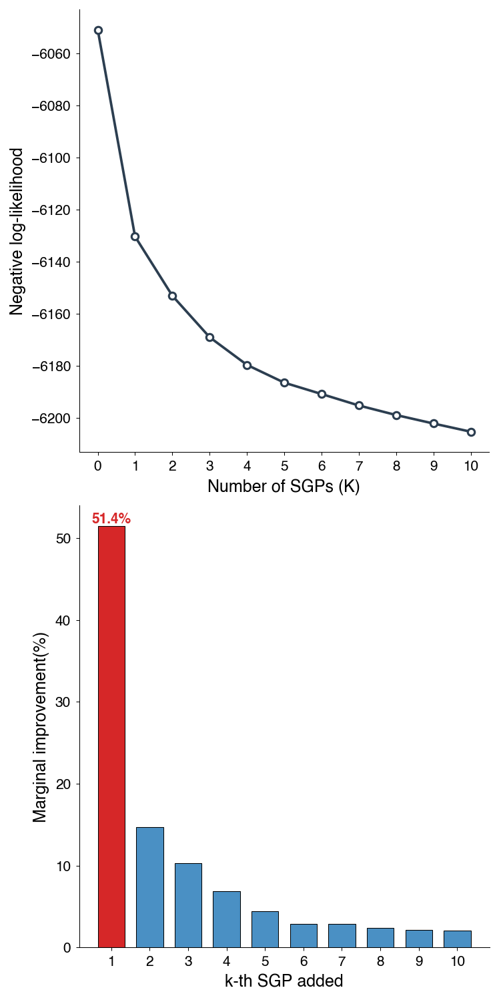

In [11]:
import numpy as np
import matplotlib.pyplot as plt

losses = np.array(decon_loss_ind)

total_improvement = losses[-1] - losses[0]
marginal_gains = np.diff(losses)
marginal_pde = (marginal_gains / total_improvement) * 100

fig, axes = plt.subplots(2, 1, figsize=(5, 10))

# ---- 左图: -Log-likelihood 折线图 ----
axes[0].plot(range(0, len(losses)), losses, 'o-', color='#2c3e50', markersize=5, 
             linewidth=1.8, markerfacecolor='white', markeredgewidth=1.5)
axes[0].set_xlabel('Number of SGPs (K)', fontsize=12)
axes[0].set_ylabel('Negative log-likelihood', fontsize=12)
axes[0].set_xticks(range(0, len(losses)))
axes[0].tick_params(axis='both', labelsize=10)
axes[0].spines['top'].set_visible(False)
axes[0].spines['right'].set_visible(False)

# # 标注K=1处的elbow
# axes[0].annotate('', xy=(1, -losses[1]), xytext=(1.8, -losses[1] + (-losses).max() * 0.08),
#                  arrowprops=dict(arrowstyle='->', color='#d62728', lw=1.5))
# axes[0].text(1.85, -losses[1] + (-losses).max() * 0.085, 'K = 1', color='#d62728', 
#              fontsize=10, fontweight='bold')

# ---- 右图: Marginal Deviance Explained 柱状图 ----
bar_colors = ['#d62728'] + ['#4a90c4'] * (len(marginal_pde) - 1)
bars = axes[1].bar(range(1, len(marginal_pde) + 1), marginal_pde, 
                   color=bar_colors, edgecolor='black', linewidth=0.5, width=0.7)
axes[1].set_xlabel('k-th SGP added', fontsize=12)
axes[1].set_ylabel('Marginal improvement(%)', fontsize=12)
axes[1].set_xticks(range(1, len(marginal_pde) + 1))
axes[1].tick_params(axis='both', labelsize=10)
axes[1].spines['top'].set_visible(False)
axes[1].spines['right'].set_visible(False)

# 在第一个柱子上方标注
axes[1].annotate(f'{marginal_pde[0]:.1f}%', xy=(1, marginal_pde[0]),
                 ha='center', va='bottom', fontsize=10, fontweight='bold', color='#d62728')

# # 子图标签 (a) (b)
# axes[0].text(-0.15, 1.05, 'a', transform=axes[0].transAxes, fontsize=14, fontweight='bold')
# axes[1].text(-0.15, 1.05, 'b', transform=axes[1].transAxes, fontsize=14, fontweight='bold')

plt.tight_layout(w_pad=3)
# plt.savefig('K_selection_deviance.pdf', dpi=300, bbox_inches='tight')
plt.show()

# print("=" * 50)
# print("Marginal deviance explained (%):")
# for i, v in enumerate(marginal_pde):
#     print(f"  K={i+1}: {v:.2f}%")
# print(f"\nCumulative at K=1: {np.cumsum(marginal_pde)[0]:.1f}%")
# print(f"Cumulative at K=2: {np.cumsum(marginal_pde)[1]:.1f}%")

In [31]:
import numpy as np
import matplotlib.pyplot as plt

losses = np.array(decon_loss_ind)

total_improvement = losses[-1] - losses[0]
marginal_gains = np.diff(losses)
cumulative_pde = np.cumsum(marginal_gains / total_improvement * 100)
cumulative_pde = np.concatenate([[0], cumulative_pde])

fig, ax = plt.subplots(1, 1, figsize=(4, 3.5))

ax.plot(range(0, len(cumulative_pde)), cumulative_pde, 'o-',
        color='#2c3e50', markersize=5, linewidth=1.8,
        markerfacecolor='white', markeredgewidth=1.5)

# highlight K=1 as the elbow
ax.scatter([1], [cumulative_pde[1]], color='#d62728', s=60, zorder=5)
ax.annotate(f'K=1 ({cumulative_pde[1]:.0f}%)',
            xy=(1, cumulative_pde[1]),
            xytext=(2.5, cumulative_pde[1] - 15),
            arrowprops=dict(arrowstyle='->', color='#d62728', lw=1.2),
            color='#d62728', fontsize=10, fontweight='bold')

ax.set_xlabel('Number of SGPs (K)', fontsize=12)
ax.set_ylabel('Cumulative NLL improvement (%)', fontsize=12)
ax.set_xticks(range(0, len(cumulative_pde)))
ax.set_ylim(0, 110)
ax.tick_params(axis='both', labelsize=10)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.tight_layout()
# plt.savefig('scree_plot_mouse_brain.pdf', dpi=300, bbox_inches='tight')
plt.show()

print(f"Mouse brain: K=1 cumulative = {cumulative_pde[1]:.1f}%, K=3 cumulative = {cumulative_pde[3]:.1f}%")

NameError: name 'decon_loss_ind' is not defined

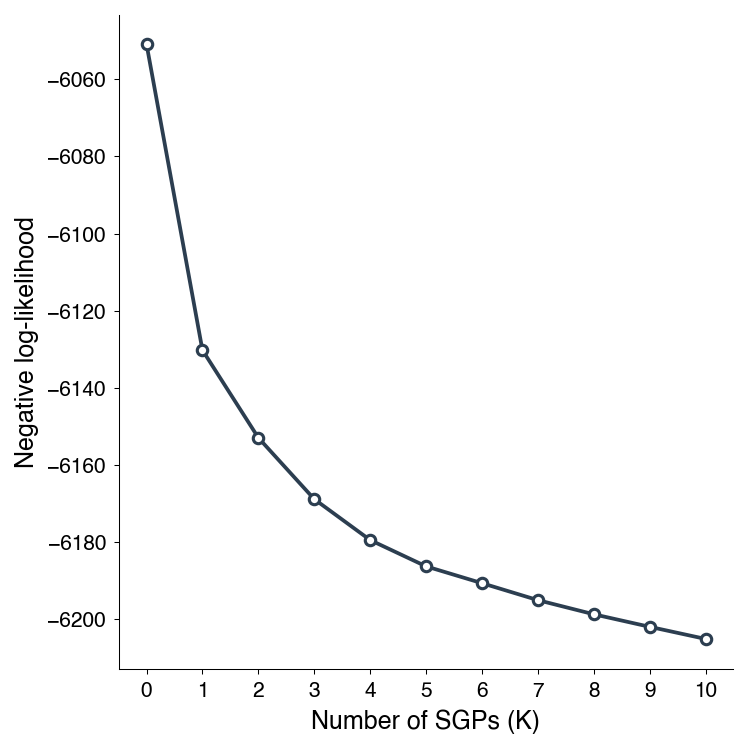

In [12]:
import numpy as np
import matplotlib.pyplot as plt

losses = np.array(decon_loss_ind)

total_improvement = losses[-1] - losses[0]
marginal_gains = np.diff(losses)
marginal_pde = (marginal_gains / total_improvement) * 100

fig, axes = plt.subplots(1, 1, figsize=(5, 5))

# ---- 左图: -Log-likelihood 折线图 ----
axes.plot(range(0, len(losses)), losses, 'o-', color='#2c3e50', markersize=5, 
             linewidth=1.8, markerfacecolor='white', markeredgewidth=1.5)
axes.set_xlabel('Number of SGPs (K)', fontsize=12)
axes.set_ylabel('Negative log-likelihood', fontsize=12)
axes.set_xticks(range(0, len(losses)))
axes.tick_params(axis='both', labelsize=10)
axes.spines['top'].set_visible(False)
axes.spines['right'].set_visible(False)

plt.tight_layout(w_pad=3)
# plt.savefig('K_selection_deviance.pdf', dpi=300, bbox_inches='tight')
plt.show()

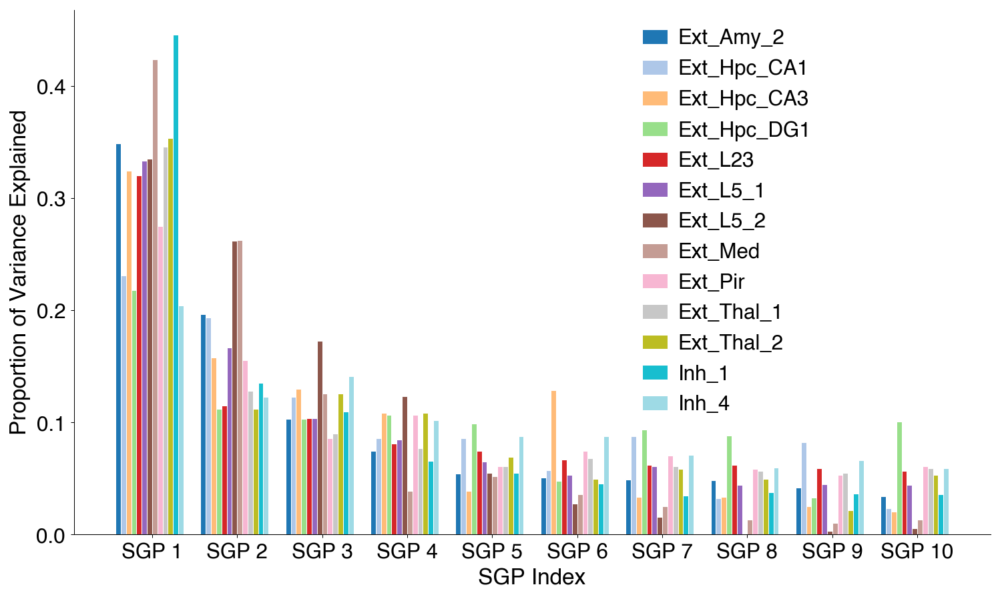

In [13]:
fig, ax = plt.subplots(figsize=(10, 6))

n_ct = len(ct_plot)
n_sgp = 10
bar_width = 0.8 / n_ct
index = np.arange(n_sgp)
cmap = plt.cm.get_cmap('tab20', n_ct)

for j in range(n_ct):
    explained_j = [variance_explained[j][i] for i in range(n_sgp)]
    ax.bar(index + j * bar_width, explained_j, bar_width,
           label=ct_plot[j], color=cmap(j), edgecolor='white', linewidth=0.5)

ax.set_xlabel('SGP Index', fontsize=16)
ax.set_ylabel('Proportion of Variance Explained', fontsize=16)
ax.set_xticks(index + bar_width * n_ct / 2)
ax.set_xticklabels([f'SGP {i+1}' for i in range(n_sgp)], fontsize=15)
ax.tick_params(axis='y', labelsize=15)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.legend(bbox_to_anchor=(0.60, 1), loc='upper left',
          frameon=False, fontsize=15, handlelength=1.2, handletextpad=0.5)

plt.tight_layout()
plt.show()

In [14]:
np.array(variance_explained)[:,0:5].sum(axis=1)

array([0.7767566 , 0.71794844, 0.75904083, 0.6374933 , 0.69385904,
       0.75300515, 0.9480485 , 0.9020926 , 0.6831441 , 0.7014426 ,
       0.7677435 , 0.8106166 , 0.65725994], dtype=float32)

In [28]:
import numpy as np
import matplotlib.pyplot as plt

# ── Global SGP contribution across ALL cell types jointly ──────────────────
# For each k, sum the rank-k reconstructions across all cell types,
# then compute the mean squared value as a proxy for global variance.
# This gives a single contribution number per SGP position (not per cell type).

n_obs   = adata_result.n_obs
n_vars  = adata_result.n_vars

global_var = []
for k in range(0, 11):
    variation_sum = np.zeros((n_obs, n_vars), dtype=np.float32)
    for ct in ct_plot:
        if k > 0:
            F = adata_result.obsm[ct].values[:, :k]   # N x k
            L = adata_result.varm[ct].values[:, :k]   # G x k
            variation_sum += F @ L.T
    global_var.append((variation_sum ** 2).mean())

global_var = np.array(global_var)
global_var_norm = global_var / global_var[-1]          # normalize to K=10

marginal_global   = global_var_norm[1:] - global_var_norm[:-1]
cumulative_global = global_var_norm                    # starts at 0, ends at 1

# ── Plot: cumulative scree (global) ────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(9, 4))

# Left: cumulative curve
axes[0].plot(range(11), cumulative_global * 100, 'o-',
             color='#2c3e50', markersize=5, linewidth=1.8,
             markerfacecolor='white', markeredgewidth=1.5)
axes[0].scatter([1], [cumulative_global[1] * 100], color='#d62728', s=60, zorder=5)
axes[0].annotate(f'K=1 ({cumulative_global[1]*100:.0f}%)',
                 xy=(1, cumulative_global[1] * 100),
                 xytext=(3, cumulative_global[1] * 100 - 12),
                 arrowprops=dict(arrowstyle='->', color='#d62728', lw=1.2),
                 color='#d62728', fontsize=10, fontweight='bold')
axes[0].set_xlabel('Number of SGPs (K)', fontsize=12)
axes[0].set_ylabel('Cumulative global variance explained (%)', fontsize=12)
axes[0].set_xticks(range(11))
axes[0].set_ylim(0, 110)
axes[0].tick_params(labelsize=10)
axes[0].spines['top'].set_visible(False)
axes[0].spines['right'].set_visible(False)

# Right: marginal bar
bar_colors = ['#d62728'] + ['#4a90c4'] * 9
axes[1].bar(range(1, 11), marginal_global * 100,
            color=bar_colors, edgecolor='black', linewidth=0.5, width=0.7)
axes[1].annotate(f'{marginal_global[0]*100:.1f}%',
                 xy=(1, marginal_global[0] * 100),
                 ha='center', va='bottom', fontsize=10,
                 fontweight='bold', color='#d62728')
axes[1].set_xlabel('k-th SGP added', fontsize=12)
axes[1].set_ylabel('Marginal global variance explained (%)', fontsize=12)
axes[1].set_xticks(range(1, 11))
axes[1].tick_params(labelsize=10)
axes[1].spines['top'].set_visible(False)
axes[1].spines['right'].set_visible(False)

plt.tight_layout()
# plt.savefig('global_sgp_contribution_mouse_brain.pdf', dpi=300, bbox_inches='tight')
plt.show()

print("Global cumulative variance explained (%) per K:")
for k, v in enumerate(cumulative_global * 100):
    print(f"  K={k}: {v:.1f}%")

NameError: name 'ct_plot' is not defined

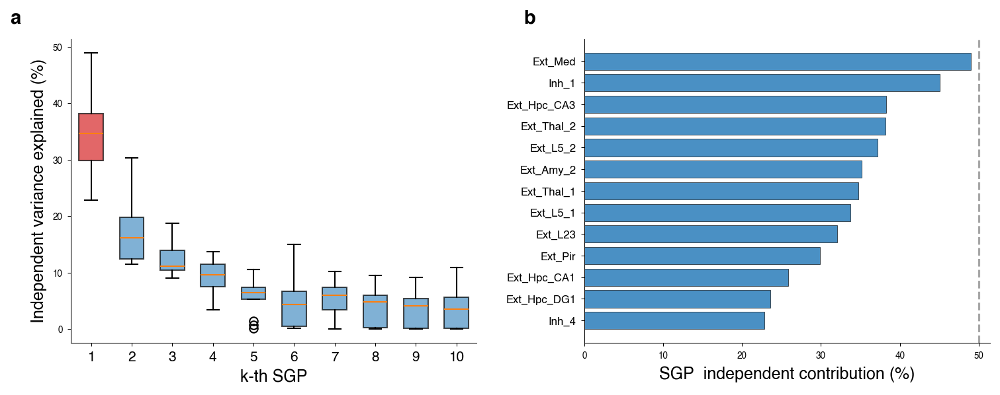

SGP_1 independent contribution:
  Mean:   34.3%
  Median: 34.7%
  Min:    22.8% (Inh_4)
  Max:    49.0% (Ext_Med)
  % cell types with SGP_1 > 50%: 0/13


In [15]:
variance_list_independent = []
for ct in ct_plot:
    F_ct = adata_result.obsm[ct].values   # N x K
    L_ct = adata_result.varm[ct].values   # G x K (or K x G, check your convention)
    
    independent_var = []
    for k in range(F_ct.shape[1]):
        recon_k = np.outer(F_ct[:, k], L_ct[:, k])  # rank-1 reconstruction from k-th SGP alone
        independent_var.append((recon_k ** 2).mean())
    
    independent_var = np.array(independent_var)
    # 归一化：每个SGP占总独立贡献的比例
    independent_var = independent_var / independent_var.sum()
    variance_list_independent.append(independent_var)

variance_independent_df = pd.DataFrame(
    variance_list_independent, 
    index=ct_plot, 
    columns=['SGP_{}'.format(i) for i in range(1, F_ct.shape[1] + 1)]
)

# ---- 可视化 ----
fig, axes = plt.subplots(1, 2, figsize=(10, 4))

# (a) Boxplot: 每个SGP position的独立贡献分布
sgp_data = [variance_independent_df.iloc[:, i].values * 100 for i in range(10)]
bp = axes[0].boxplot(sgp_data, patch_artist=True, widths=0.6)
box_colors = ['#d62728'] + ['#4a90c4'] * 9
for patch, color in zip(bp['boxes'], box_colors):
    patch.set_facecolor(color)
    patch.set_alpha(0.7)
axes[0].set_xlabel('k-th SGP', fontsize=12)
axes[0].set_ylabel('Independent variance explained (%)', fontsize=12)
axes[0].set_xticklabels(range(1, 11), fontsize=10)
axes[0].spines['top'].set_visible(False)
axes[0].spines['right'].set_visible(False)

# (b) 横向bar: SGP_1的独立贡献，按cell type排序
sgp1_pct = variance_independent_df['SGP_1'].values * 100
sorted_idx = np.argsort(sgp1_pct)
colors_bar = ['#d62728' if v >= 50 else '#4a90c4' for v in sgp1_pct[sorted_idx]]
axes[1].barh(range(len(ct_plot)), sgp1_pct[sorted_idx], color=colors_bar, edgecolor='black', linewidth=0.3)
axes[1].set_yticks(range(len(ct_plot)))
axes[1].set_yticklabels(np.array(ct_plot)[sorted_idx], fontsize=8)
axes[1].set_xlabel('SGP₁ independent contribution (%)', fontsize=12)
axes[1].axvline(x=50, color='gray', linestyle='--', alpha=0.7)
axes[1].spines['top'].set_visible(False)
axes[1].spines['right'].set_visible(False)

axes[0].text(-0.15, 1.05, 'a', transform=axes[0].transAxes, fontsize=14, fontweight='bold')
axes[1].text(-0.15, 1.05, 'b', transform=axes[1].transAxes, fontsize=14, fontweight='bold')

plt.tight_layout(w_pad=3)
plt.show()

# ---- 统计 ----
sgp1 = variance_independent_df['SGP_1'].values * 100
print("=" * 60)
print(f"SGP_1 independent contribution:")
print(f"  Mean:   {sgp1.mean():.1f}%")
print(f"  Median: {np.median(sgp1):.1f}%")
print(f"  Min:    {sgp1.min():.1f}% ({ct_plot[np.argmin(sgp1)]})")
print(f"  Max:    {sgp1.max():.1f}% ({ct_plot[np.argmax(sgp1)]})")
print(f"  % cell types with SGP_1 > 50%: {(sgp1 > 50).sum()}/{len(sgp1)}")

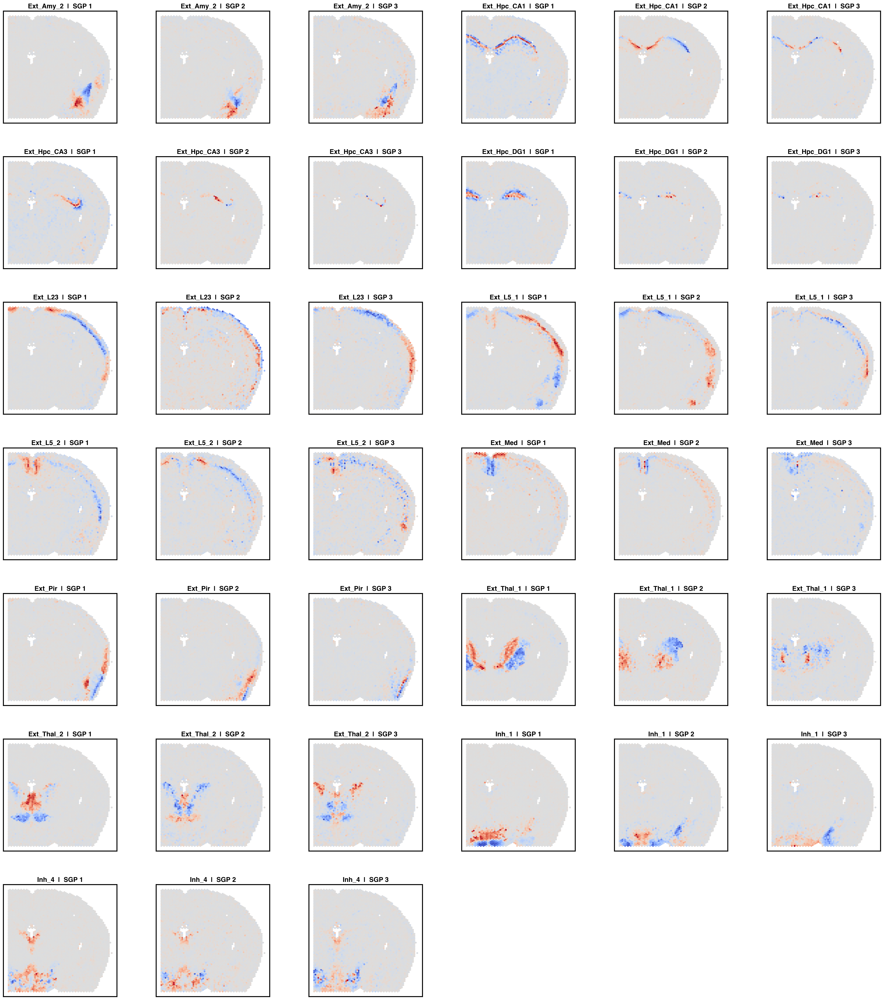

In [16]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np

selected_cts = ct_plot  # 按需修改
n_sgps = 3              # 每个 cell type 画前 3 个 SGP
cts_per_row = 2         # 每行放 2 个 cell type
ncols = cts_per_row * n_sgps  # 6 列
nrows = int(np.ceil(len(selected_cts) / cts_per_row))
cmap = 'coolwarm'

fig, axes = plt.subplots(nrows, ncols, figsize=(4.5 * ncols, 4.5 * nrows))

# 当只有一行时，保证 axes 是二维数组
if nrows == 1:
    axes = axes[np.newaxis, :]

for idx, ct in enumerate(selected_cts):
    row = idx // cts_per_row
    col_offset = (idx % cts_per_row) * n_sgps

    data = adata_result.obsm[ct].values  # shape: (N, K)

    for j in range(min(n_sgps, data.shape[1])):
        ax = axes[row, col_offset + j]
        values = data[:, j]
        norm_ij = mpl.colors.TwoSlopeNorm(vcenter=0.0)

        sca = ax.scatter(
            adata_result.obsm["spatial"][:, 0],
            adata_result.obsm["spatial"][:, 1],
            c=values,
            s=8,
            cmap=cmap,
            norm=norm_ij,
        )
        ax.set_title(f'{ct}  |  SGP {j + 1}', fontsize=14, fontweight='bold')
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_aspect('equal', adjustable='box')
        for spine in ax.spines.values():
            spine.set_linewidth(2)

        # # 每个子图右侧加 colorbar
        # cbar = fig.colorbar(sca, ax=ax, fraction=0.046, pad=0.04)
        # cbar.ax.tick_params(labelsize=9)

# 隐藏多余的空白子图
total_used = len(selected_cts)
if total_used % cts_per_row != 0:
    remainder = cts_per_row - (total_used % cts_per_row)
    for r in range(remainder):
        for j in range(n_sgps):
            axes[nrows - 1, (cts_per_row - remainder + r) * n_sgps + j].axis('off')

fig.subplots_adjust(left=0.02, right=0.98, top=0.94, bottom=0.02,
                    wspace=0.30, hspace=0.30)
plt.show()

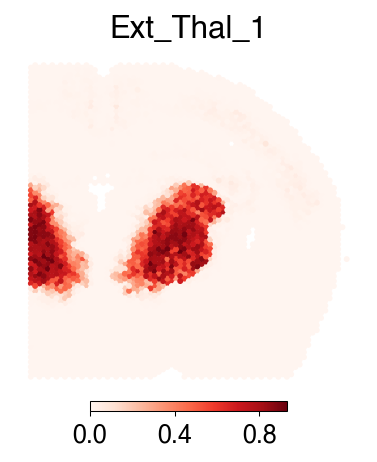

In [17]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
from matplotlib.ticker import MaxNLocator

ct = 'Ext_Thal_1'  
data = adata_result.obsm['proportion'][ct]

fig, ax = plt.subplots(figsize=(3.5, 3.2))

sc = ax.scatter(
    adata_result.obsm["spatial"][:, 0],
    adata_result.obsm["spatial"][:, 1],
    c=data,
    s=8,
    cmap='Reds',
    linewidths=0
)
cb   = fig.colorbar(sc, ax=ax, shrink=0.4, pad=0.02, orientation='horizontal')
cb.locator = MaxNLocator(nbins=1)
cb.update_ticks()
cb.ax.tick_params(labelsize=12)
#cb.set_label('Proportion', fontsize=12)

# 去掉边框
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_linewidth(False)
ax.spines['bottom'].set_linewidth(False)

ax.set_title(ct, fontsize=15)
ax.set_xticks([])
ax.set_yticks([])
ax.set_aspect('equal', adjustable='box')
plt.tight_layout()
plt.show()

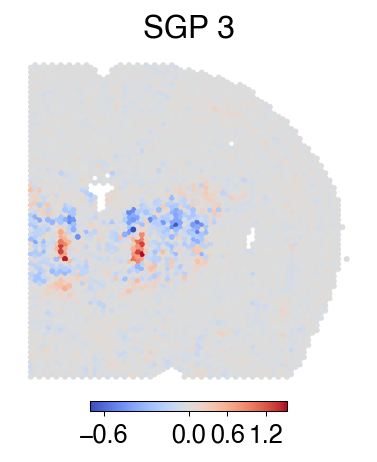

In [190]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
from matplotlib.ticker import MaxNLocator

ct = 'Ext_Thal_1'  
index = 3
data = adata_result.obsm[ct].values[:, index-1]  # SGP_1 的值

fig, ax = plt.subplots(figsize=(3.5, 3.2))
norm = mpl.colors.TwoSlopeNorm(vcenter=0.0)
sc = ax.scatter(
    adata_result.obsm["spatial"][:, 0],
    adata_result.obsm["spatial"][:, 1],
    c=data,
    s=8,
    cmap='coolwarm',
    linewidths=0,
    norm=norm
)
cb   = fig.colorbar(sc, ax=ax, shrink=0.4, pad=0.02, orientation='horizontal')
cb.locator = MaxNLocator(nbins=4)
cb.update_ticks()
cb.ax.tick_params(labelsize=12)
#cb.set_label('Proportion', fontsize=12)
#no colorbar
# ax.colorbar = None

# 去掉边框
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_linewidth(False)
ax.spines['bottom'].set_linewidth(False)

ax.set_title(f'SGP {index}', fontsize=15)
ax.set_xticks([])
ax.set_yticks([])
ax.set_aspect('equal', adjustable='box')
plt.tight_layout()
plt.show()

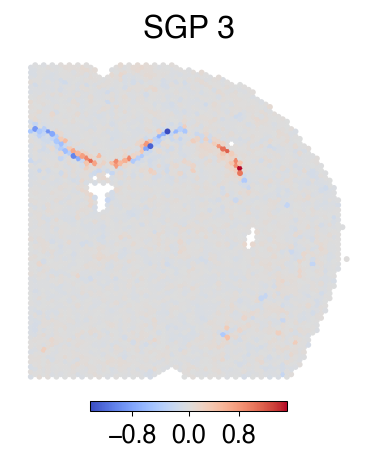

In [196]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
from matplotlib.ticker import MaxNLocator

ct = 'Ext_Hpc_CA1'  
index = 3
data = adata_result.obsm[ct].values[:, index-1]  # SGP_1 的值

fig, ax = plt.subplots(figsize=(3.5, 3.2))
norm = mpl.colors.TwoSlopeNorm(vcenter=0.0)
sc = ax.scatter(
    adata_result.obsm["spatial"][:, 0],
    adata_result.obsm["spatial"][:, 1],
    c=data,
    s=8,
    cmap='coolwarm',
    linewidths=0,
    norm=norm
)
cb   = fig.colorbar(sc, ax=ax, shrink=0.4, pad=0.02, orientation='horizontal')
cb.locator = MaxNLocator(nbins=4)
cb.update_ticks()
cb.ax.tick_params(labelsize=12)
#cb.set_label('Proportion', fontsize=12)
#no colorbar
# ax.colorbar = None

# 去掉边框
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_linewidth(False)
ax.spines['bottom'].set_linewidth(False)

ax.set_title(f'SGP {index}', fontsize=15)
ax.set_xticks([])
ax.set_yticks([])
ax.set_aspect('equal', adjustable='box')
plt.tight_layout()
plt.show()

In [19]:
loading_ct = adata_result.varm[ct]
loading_ct['loading_1'].nlargest(10)
loading_ct['loading_1'].nsmallest(10)

Ttr       -2.012819
Tenm2     -1.216850
Btbd3     -0.845325
Nrgn      -0.824256
Col25a1   -0.759004
Camk2n1   -0.679698
Gfra1     -0.626153
Hs6st2    -0.607659
Sp9       -0.606902
Pnoc      -0.577529
Name: loading_1, dtype: float32

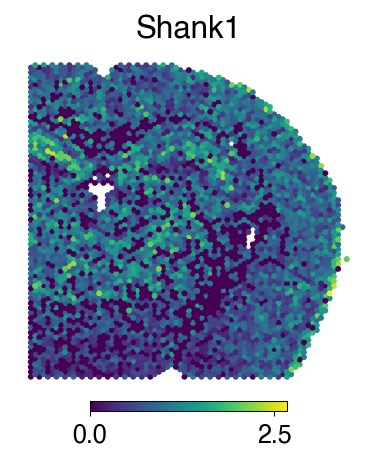

In [198]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
from matplotlib.ticker import MaxNLocator

ct = 'Ext_Thal_1'  
gene = 'Shank1'
data = adata_result[:, gene].X  # SGP_1 的值

fig, ax = plt.subplots(figsize=(3.5, 3.2))
norm = mpl.colors.TwoSlopeNorm(vcenter=0.0)
sc = ax.scatter(
    adata_result.obsm["spatial"][:, 0],
    adata_result.obsm["spatial"][:, 1],
    c=data,
    s=8,
    cmap='viridis',
    linewidths=0,
    #norm=norm
)
cb   = fig.colorbar(sc, ax=ax, shrink=0.4, pad=0.02, orientation='horizontal')
cb.locator = MaxNLocator(nbins=1)
cb.update_ticks()
cb.ax.tick_params(labelsize=12)
#cb.set_label('Proportion', fontsize=12)

# 去掉边框
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_linewidth(False)
ax.spines['bottom'].set_linewidth(False)

ax.set_title(gene, fontsize=15)
ax.set_xticks([])
ax.set_yticks([])
ax.set_aspect('equal', adjustable='box')
plt.tight_layout()
plt.show()

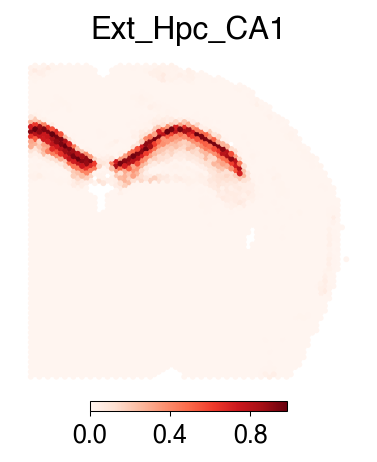

In [21]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
from matplotlib.ticker import MaxNLocator

ct = 'Ext_Hpc_CA1'  
data = adata_result.obsm['proportion'][ct]

fig, ax = plt.subplots(figsize=(3.5, 3.2))

sc = ax.scatter(
    adata_result.obsm["spatial"][:, 0],
    adata_result.obsm["spatial"][:, 1],
    c=data,
    s=8,
    cmap='Reds',
    linewidths=0
)
cb   = fig.colorbar(sc, ax=ax, shrink=0.4, pad=0.02, orientation='horizontal')
cb.locator = MaxNLocator(nbins=1)
cb.update_ticks()
cb.ax.tick_params(labelsize=12)
#cb.set_label('Proportion', fontsize=12)

# 去掉边框
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_linewidth(False)
ax.spines['bottom'].set_linewidth(False)

ax.set_title(ct, fontsize=15)
ax.set_xticks([])
ax.set_yticks([])
ax.set_aspect('equal', adjustable='box')
plt.tight_layout()
plt.show()

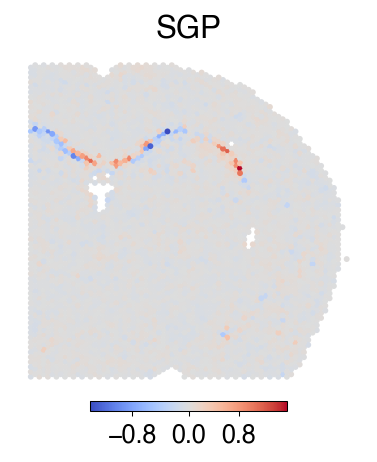

In [165]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
from matplotlib.ticker import MaxNLocator

ct = 'Ext_Hpc_CA1'  
data = adata_result.obsm[ct].values[:, 2]  # SGP_1 的值

fig, ax = plt.subplots(figsize=(3.5, 3.2))
norm = mpl.colors.TwoSlopeNorm(vcenter=0.0)
sc = ax.scatter(
    adata_result.obsm["spatial"][:, 0],
    adata_result.obsm["spatial"][:, 1],
    c=data,
    s=8,
    cmap='coolwarm',
    linewidths=0,
    norm=norm
)
cb   = fig.colorbar(sc, ax=ax, shrink=0.4, pad=0.02, orientation='horizontal')
cb.locator = MaxNLocator(nbins=4)
cb.update_ticks()
cb.ax.tick_params(labelsize=12)
#cb.set_label('Proportion', fontsize=12)

# 去掉边框
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_linewidth(False)
ax.spines['bottom'].set_linewidth(False)

ax.set_title('SGP', fontsize=15)
ax.set_xticks([])
ax.set_yticks([])
ax.set_aspect('equal', adjustable='box')
plt.tight_layout()
plt.show()

In [ ]:
ct = 'Ext_Hpc_CA1'
loading_ct = adata_result.varm[ct]
#loading_ct['loading_1'].nlargest(50)
loading_ct['loading_2'].(10)

Bok       0.483986
Dach1     0.482610
Adgra1    0.470669
Nr4a2     0.467929
Spock3    0.446433
Clic4     0.444363
Cbfb      0.443561
Ndst4     0.417441
H2-D1     0.411194
Itgav     0.407897
Name: loading_2, dtype: float32

In [143]:
loading_ct['loading_1']['Gm42418']

-0.10185322

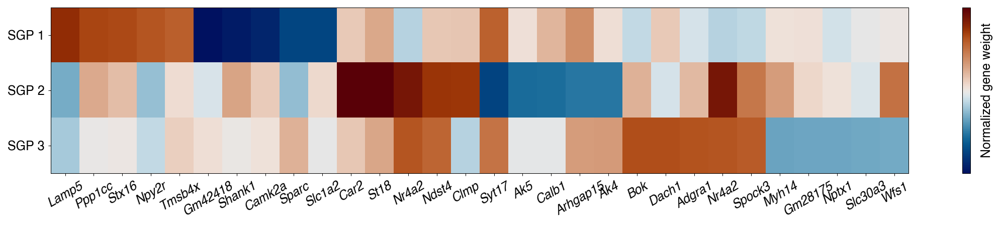

In [26]:
from scipy.cluster.hierarchy import linkage, dendrogram, leaves_list
from matplotlib.colors import TwoSlopeNorm
from cmcrameri import cm

# 准备数据（同你原来的代码）
ct = 'Ext_Hpc_CA1'
loading_ct = adata_result.varm[ct]
top_genes = []
for i in range(3):
    if 'Ttr' in loading_ct[f'loading_{i}'].nlargest(6).index:
        top_genes.extend(loading_ct[f'loading_{i}'].nlargest(6).index)
        # remove 'Ttr' from top_genes to avoid it dominating the heatmap
        top_genes = [gene for gene in top_genes if gene != 'Ttr']
    else:
        top_genes.extend(loading_ct[f'loading_{i}'].nlargest(5).index)
    if 'Ttr' in loading_ct[f'loading_{i}'].nsmallest(6).index:
        top_genes.extend(loading_ct[f'loading_{i}'].nsmallest(6).index)
        # remove 'Ttr' from top_genes to avoid it dominating the heatmap
        top_genes = [gene for gene in top_genes if gene != 'Ttr']
    else:   
        top_genes.extend(loading_ct[f'loading_{i}'].nsmallest(5).index)
top_genes = list(top_genes)
loading_ct_df_highlight = loading_ct.loc[top_genes, ['loading_0', 'loading_1', 'loading_2']]
loading_ct_df_highlight.index.name = 'Gene'

# ============================================================
# 对 gene（行）做 hierarchical clustering 重排序
# ============================================================
Z = linkage(loading_ct_df_highlight.values, method='ward', metric='euclidean')
# gene_order = leaves_list(Z)
#loading_ct_df_highlight = loading_ct_df_highlight.loc[gene_order]

# 更新 gene 名字顺序
gene_highlighted_ordered = loading_ct_df_highlight.index.tolist()

# ============================================================
# 画图
# ============================================================
plt.figure(figsize=(15, 3))
im = plt.imshow(
    loading_ct_df_highlight.T,
    cmap=cm.vik, aspect='auto',
    norm=TwoSlopeNorm(vcenter=0)
)

cbar = plt.colorbar(im)
cbar.set_label('Normalized gene weight', rotation=90, labelpad=10, fontsize=12)
cbar.set_ticks([])

plt.xticks(range(len(gene_highlighted_ordered)), gene_highlighted_ordered, 
           rotation=30, fontsize=12, fontstyle='italic')
plt.yticks(range(3), [ f'SGP {i+1}' for i in range(3) ], fontsize=12)

plt.tight_layout()
plt.show()

In [20]:
gene_order = ['Sparc',
 'Slc1a2',
 'Gm42418',
 'Shank1',
 'Camk2a', 'Lamp5',
 'Npy2r',
 'Tmsb4x',
 'Stx16',
 'Ppp1cc', 
 'Ak5',
 'Calb1',
 'Ak4',
 'Arhgap15','Car2',
 'St18',
 'Ndst4',
 'Nr4a2', 'Clmp','Gm28175',
 'Nptx1',
 'Slc30a3','Wfs1',
 'Dach1',
 'Spock3',
 'Adgra1',
 'Bok', ]

In [12]:
loading_ct_df_highlight.index.to_list()

['Sparc',
 'Slc1a2',
 'Gm42418',
 'Shank1',
 'Camk2a',
 'Syt17',
 'Ak5',
 'Calb1',
 'Ak4',
 'Arhgap15',
 'Dach1',
 'Spock3',
 'Adgra1',
 'Bok',
 'Car2',
 'St18',
 'Ndst4',
 'Nr4a2',
 'Gm28175',
 'Nptx1',
 'Slc30a3',
 'Clmp',
 'Wfs1',
 'Myh14',
 'Lamp5',
 'Npy2r',
 'Tmsb4x',
 'Stx16',
 'Ppp1cc']

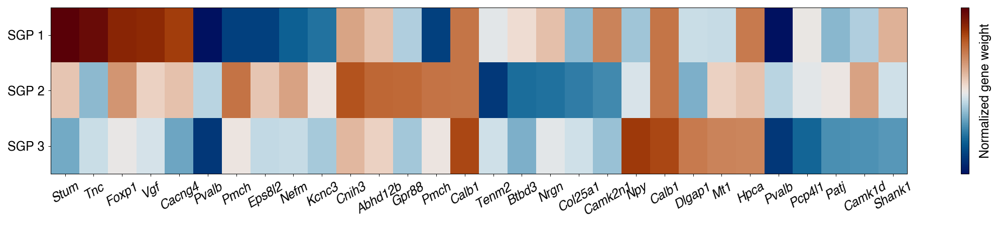

In [25]:
from scipy.cluster.hierarchy import linkage, dendrogram, leaves_list
from matplotlib.colors import TwoSlopeNorm
from cmcrameri import cm

# 准备数据（同你原来的代码）
ct = 'Ext_Thal_1'
loading_ct = adata_result.varm[ct]
top_genes = []
for i in range(3):
    if 'Ttr' in loading_ct[f'loading_{i}'].nlargest(6).index:
        top_genes.extend(loading_ct[f'loading_{i}'].nlargest(6).index)
        # remove 'Ttr' from top_genes to avoid it dominating the heatmap
        top_genes = [gene for gene in top_genes if gene != 'Ttr']
    else:
        top_genes.extend(loading_ct[f'loading_{i}'].nlargest(5).index)
    if 'Ttr' in loading_ct[f'loading_{i}'].nsmallest(6).index:
        top_genes.extend(loading_ct[f'loading_{i}'].nsmallest(6).index)
        # remove 'Ttr' from top_genes to avoid it dominating the heatmap
        top_genes = [gene for gene in top_genes if gene != 'Ttr']
    else:   
        top_genes.extend(loading_ct[f'loading_{i}'].nsmallest(5).index)
top_genes = list(top_genes)
loading_ct_df_highlight = loading_ct.loc[top_genes, ['loading_0', 'loading_1', 'loading_2']]
loading_ct_df_highlight.index.name = 'Gene'

# ============================================================
# 对 gene（行）做 hierarchical clustering 重排序
# ============================================================
Z = linkage(loading_ct_df_highlight.values, method='ward', metric='euclidean')
gene_order = leaves_list(Z)
#loading_ct_df_highlight = loading_ct_df_highlight.iloc[gene_order]

# 更新 gene 名字顺序
gene_highlighted_ordered = loading_ct_df_highlight.index.tolist()

# ============================================================
# 画图
# ============================================================
plt.figure(figsize=(15, 3))
im = plt.imshow(
    loading_ct_df_highlight.T,
    cmap=cm.vik, aspect='auto',
    norm=TwoSlopeNorm(vcenter=0)
)

cbar = plt.colorbar(im)
cbar.set_label('Normalized gene weight', rotation=90, labelpad=10, fontsize=12)
cbar.set_ticks([])

plt.xticks(range(len(gene_highlighted_ordered)), gene_highlighted_ordered, 
           rotation=30, fontsize=12, fontstyle='italic')
plt.yticks(range(3), [ f'SGP {i+1}' for i in range(3) ], fontsize=12)

plt.tight_layout()
plt.show()

In [ ]:
gene_order = ['Pvalb',
 'Pmch',
 'Kcnc3',
 'Eps8l2',
 'Nefm',
 'Vgf',
 'Foxp1',
 'Stum',
 'Cacng4',
 'Tnc', 'Camk2n1','Col25a1',
 'Tenm2',
 'Nrgn',
 'Btbd3', ]

In [23]:
loading_ct_df_highlight.index.tolist()

['Col25a1',
 'Tenm2',
 'Nrgn',
 'Btbd3',
 'Shank1',
 'Pcp4l1',
 'Gpr88',
 'Camk1d',
 'Patj',
 'Pvalb',
 'Pmch',
 'Kcnc3',
 'Eps8l2',
 'Nefm',
 'Vgf',
 'Foxp1',
 'Stum',
 'Cacng4',
 'Camk2n1',
 'Tnc',
 'Dlgap1',
 'Npy',
 'Mt1',
 'Abhd12b',
 'Cnih3',
 'Hpca',
 'Calb1']

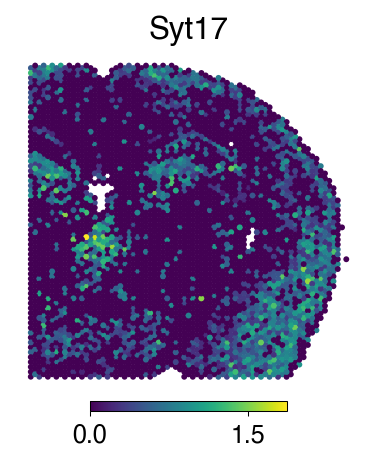

In [15]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
from matplotlib.ticker import MaxNLocator

ct = 'Ext_Thal_1'  
gene = 'Syt17'
data = adata_result[:, gene].X  # SGP_1 的值

fig, ax = plt.subplots(figsize=(3.5, 3.2))
norm = mpl.colors.TwoSlopeNorm(vcenter=0.0)
sc = ax.scatter(
    adata_result.obsm["spatial"][:, 0],
    adata_result.obsm["spatial"][:, 1],
    c=data,
    s=8,
    cmap='viridis',
    linewidths=0,
    #norm=norm
)
cb   = fig.colorbar(sc, ax=ax, shrink=0.4, pad=0.02, orientation='horizontal')
cb.locator = MaxNLocator(nbins=1)
cb.update_ticks()
cb.ax.tick_params(labelsize=12)
#cb.set_label('Proportion', fontsize=12)

# 去掉边框
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_linewidth(False)
ax.spines['bottom'].set_linewidth(False)

ax.set_title(gene, fontsize=15)
ax.set_xticks([])
ax.set_yticks([])
ax.set_aspect('equal', adjustable='box')
plt.tight_layout()
plt.show()

In [6]:
# ─────────────────────────────────────────────────────────────
# 1-A  坐标核变换
# ─────────────────────────────────────────────────────────────
def transloc_func(coords, lker, transfunc):
    """将坐标变换为核特征矩阵，用于捕捉不同尺度的空间模式。"""
    coords_c = coords - coords.mean(axis=0, keepdims=True)
    out = np.zeros_like(coords_c)
    for j in range(coords_c.shape[1]):
        col = coords_c[:, j]
        #qs  = np.quantile(np.abs(col), np.arange(0.2, 1.01, 0.2))
        qs = np.quantile(np.abs(col), [0.05743, 0.11206, 0.59694, 0.8, 1.0])
        l   = max(qs[lker - 1], 1e-15)#*np.sqrt(2)
        if transfunc == "gaussian":
            out[:, j] = np.exp(-col**2 / (2 * l**2))
        elif transfunc == "cosine":
            out[:, j] = np.cos(2 * np.pi * col / l)
    return out


# ─────────────────────────────────────────────────────────────
# 1-B  单核 SPARK-X 检验
# ─────────────────────────────────────────────────────────────
def sparkx_sk_single(factor_vec, coords, kernel_type="projection", lker=1):
    """
    单核检验。统计量 T = n * (f'X(X'X)^{-1}X'f) / (f'f)，
    即 n 倍的 R²，衡量因子值能被空间坐标解释的比例。

    Parameters
    ----------
    factor_vec  : (n,)   标准化后的因子向量
    coords      : (n, 2) 标准化后的坐标
    kernel_type : 'projection' | 'gaussian' | 'cosine'
    lker        : 1~5，核带宽等级

    Returns
    -------
    stat, pval
    """
    factor_vec = np.asarray(factor_vec, dtype=np.float64)
    coords     = np.asarray(coords,     dtype=np.float64)
    n, d = coords.shape

    loc = transloc_func(coords, lker, kernel_type) if kernel_type in ("gaussian", "cosine") else coords.copy()
    X   = loc - loc.mean(axis=0, keepdims=True)

    XtX_inv = np.linalg.inv(X.T @ X)
    ehl     = factor_vec @ X
    y_sq    = np.dot(factor_vec, factor_vec)
    quad    = ehl @ XtX_inv @ ehl
    stat    = n * quad / max(y_sq, 1e-15)

    y_bar   = factor_vec.mean()
    lam_G   = 1.0 - n * y_bar**2 / max(y_sq, 1e-15)

    if y_sq > 1e-15 and lam_G > 1e-15:
        pval = np.clip(1.0 - chi2.cdf(stat / lam_G, df=d), 0.0, 1.0)
    else:
        stat, pval = 0.0, 1.0

    return stat, pval


# ─────────────────────────────────────────────────────────────
# 1-C  ACAT 合并多核 p 值
# ─────────────────────────────────────────────────────────────
def acat_combine_single(pvals, weights=None):
    """
    Aggregated Cauchy Association Test：
    T_ACAT = Σ w_k * tan((0.5 - p_k) * π)
    对极小 p 值高度敏感，无需假设各核独立。
    """
    pvals   = np.clip(np.asarray(pvals, dtype=np.float64), 1e-15, 1 - 1e-15)
    weights = np.ones(len(pvals)) / len(pvals) if weights is None else weights
    T       = np.sum(weights * np.tan((0.5 - pvals) * np.pi))
    return 0.5 - np.arctan(T) / np.pi, T

In [7]:
# ─────────────────────────────────────────────────────────────
# 1-D  按 proportion 筛选 spots
# ─────────────────────────────────────────────────────────────
def select_spots(proportion_vec, method="threshold", threshold=0.0,
                 quantile=0.5, min_spots=30):
    """
    筛选该细胞类型 "集中存在" 的 spots，避免噪声稀释空间信号。

    method
    ------
    'threshold' : proportion > threshold
    'quantile'  : proportion >= 非零值的第 quantile 分位数
    'topk'      : proportion 最高的 top (quantile*100)%
    'nonzero'   : proportion > 0
    'adaptive'  : Otsu 自适应阈值

    保底：筛选后 spot 数 < min_spots 时依次回退到 nonzero → 全部。
    """
    n = len(proportion_vec)

    if method == "nonzero":
        mask = proportion_vec > 0

    elif method == "threshold":
        mask = proportion_vec > threshold

    elif method == "quantile":
        nz = proportion_vec[proportion_vec > 0]
        mask = proportion_vec >= np.quantile(nz, quantile) if len(nz) >= min_spots else proportion_vec > 0

    elif method == "topk":
        k    = max(int(n * quantile), min_spots)
        idx  = np.argsort(proportion_vec)[::-1][:k]
        mask = np.zeros(n, dtype=bool)
        mask[idx] = True

    elif method == "adaptive":
        best_thresh, best_var = 0.0, -1
        for t in np.linspace(proportion_vec.min(), proportion_vec.max(), 200):
            c0, c1 = proportion_vec[proportion_vec <= t], proportion_vec[proportion_vec > t]
            if len(c0) == 0 or len(c1) == 0:
                continue
            bv = (len(c0)/n) * (len(c1)/n) * (c0.mean() - c1.mean())**2
            if bv > best_var:
                best_var, best_thresh = bv, t
        mask = proportion_vec > best_thresh

    else:
        raise ValueError(f"Unknown method: {method}")

    if mask.sum() < min_spots:
        mask = proportion_vec > 0
    if mask.sum() < min_spots:
        mask = np.ones(n, dtype=bool)
    return mask


# ─────────────────────────────────────────────────────────────
# 1-E  对单个细胞类型跑完整 SPARK-X (11 核 + ACAT)
# ─────────────────────────────────────────────────────────────
def sparkx_single_celltype(factor_vec, coords, proportion_vec,
                           filter_method="threshold", filter_threshold=0.0,
                           filter_quantile=0.5, min_spots=30, n_kernels=3):
    """
    流程：proportion 筛选 → 标准化 → 11 核检验 → ACAT 合并

    Returns
    -------
    combined_pval, T_acat, n_used, per_kernel_pvals (shape 11)
    """
    mask   = select_spots(proportion_vec, method=filter_method,
                          threshold=filter_threshold, quantile=filter_quantile,
                          min_spots=min_spots)
    sub_f  = factor_vec[mask]
    sub_c  = coords[mask]
    n_used = mask.sum()

    if np.std(sub_f) < 1e-15 or n_used < 10:
        return 1.0, 0.0, n_used, np.ones(2*n_kernels + 1)

    # 标准化（与 run_null_distribution 保持一致）
    sub_f = (sub_f - sub_f.mean())# / max(sub_f.std(), 1e-15)
    sub_c = (sub_c - sub_c.mean(axis=0))# / np.maximum(sub_c.std(axis=0), 1e-15)

    pvals = np.zeros(2*n_kernels + 1)
    _, pvals[0] = sparkx_sk_single(sub_f, sub_c, "projection")
    for k in range(n_kernels):
        _, pvals[1 + k] = sparkx_sk_single(sub_f, sub_c, "gaussian", lker=k+1)
        _, pvals[1 + n_kernels + k] = sparkx_sk_single(sub_f, sub_c, "cosine",   lker=k+1)

    combined_pval, T_acat = acat_combine_single(pvals)
    return combined_pval, T_acat, n_used, pvals


print("Statistical functions loaded.")

Statistical functions loaded.


In [8]:
kernel_specs =[('projection', 1),
 ('gaussian', 1),
 ('gaussian', 2),
 ('gaussian', 3),
 #('gaussian', 4),
 #('gaussian', 5),
 ('cosine', 1),
 ('cosine', 2),
 ('cosine', 3),
 #('cosine', 4),
 #('cosine', 5)
 ]

In [15]:

from scipy.stats import chi2, beta as beta_dist
from scipy.spatial import KDTree
from scipy.stats import norm as scipy_norm

# ── 公共：取 prop > 0.1 的 spots ──────────────────────────────
ct = 'Ext_Hpc_CA1'
prop_vec = adata_result.obsm['proportion'][ct]
coordinates = adata_result.obsm['spatial']
mask  = select_spots(prop_vec, method="threshold", threshold=0.1, min_spots=30)
sub_c = coordinates[mask].copy()
for i in range(10):
    factor_i = adata_result.obsm[ct].values[:, i]
    sub_f = factor_i[mask].copy()

    p_list = []
    for ktype, klker in kernel_specs:
        _, p = sparkx_sk_single(sub_f, sub_c, kernel_type=ktype, lker=klker)
        p_list.append(p)
        #print(f"{ktype} (lker={klker}): p = {p:.3e}")
    p, _ = acat_combine_single(np.array(p_list))
    print(f"Combined ACAT p-value: {p:.3e}")

Combined ACAT p-value: 5.517e-02
Combined ACAT p-value: 7.050e-15
Combined ACAT p-value: 1.115e-05
Combined ACAT p-value: 1.356e-01
Combined ACAT p-value: 4.305e-03
Combined ACAT p-value: 4.097e-02
Combined ACAT p-value: 6.687e-02
Combined ACAT p-value: 7.050e-15
Combined ACAT p-value: 7.640e-01
Combined ACAT p-value: 1.951e-04


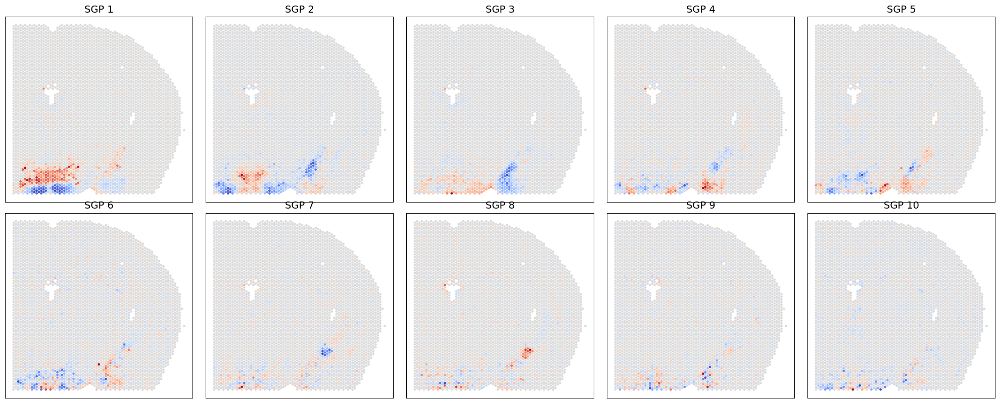

In [39]:
# plot factors for a celltype
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm
ct = 'Inh_1'
coordinates = adata_result.obsm['spatial']
fig, axes = plt.subplots(2, 5, figsize=(20, 8))
for i in range(10):
    factor_i = adata_result.obsm[ct].values[:, i]
    ax = axes[i // 5, i % 5]
    sc = ax.scatter(
        coordinates[:, 0], coordinates[:, 1],
        c=factor_i, s=12, cmap='coolwarm', linewidths=0,
        norm=TwoSlopeNorm(vcenter=0)
    )
    ax.set_title(f'SGP {i+1}', fontsize=14)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect('equal', adjustable='box')
plt.tight_layout()
plt.show()

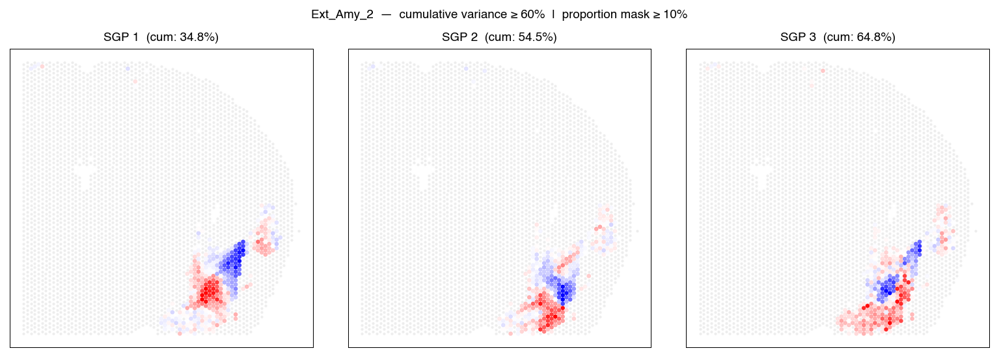

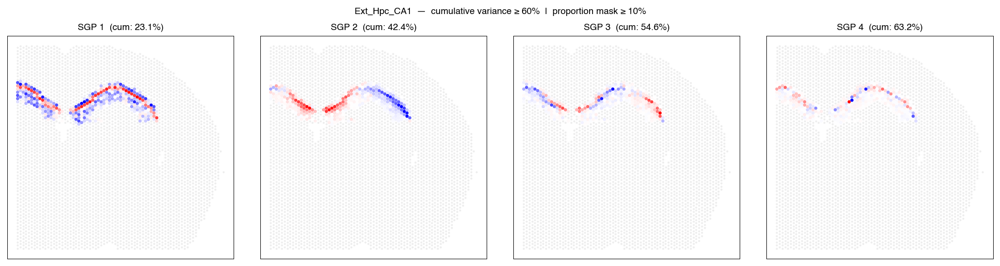

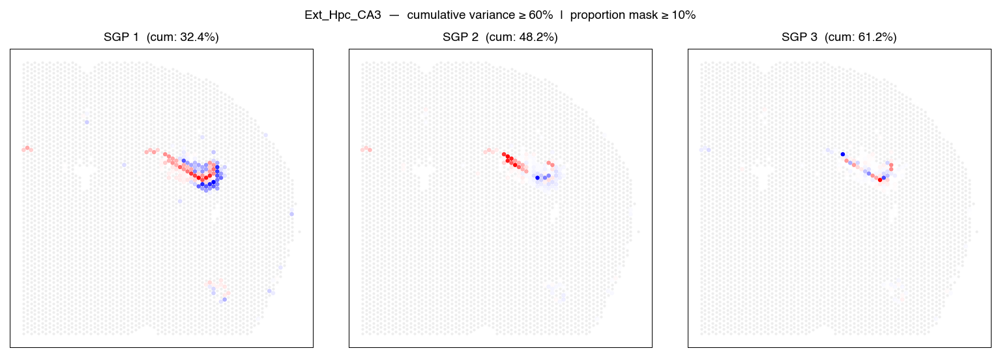

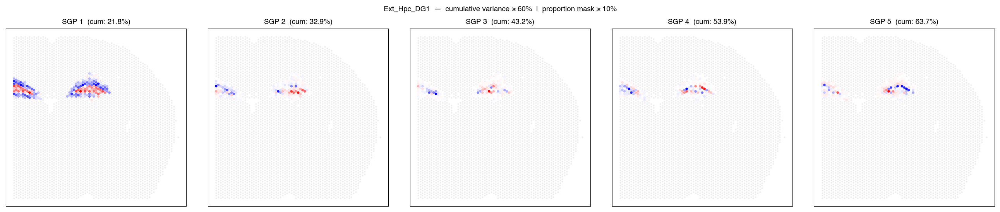

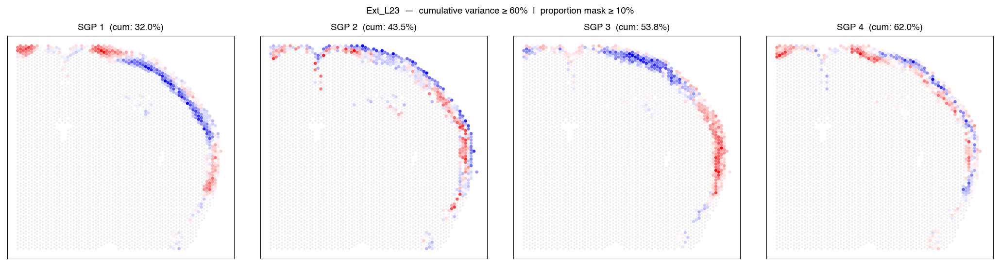

...

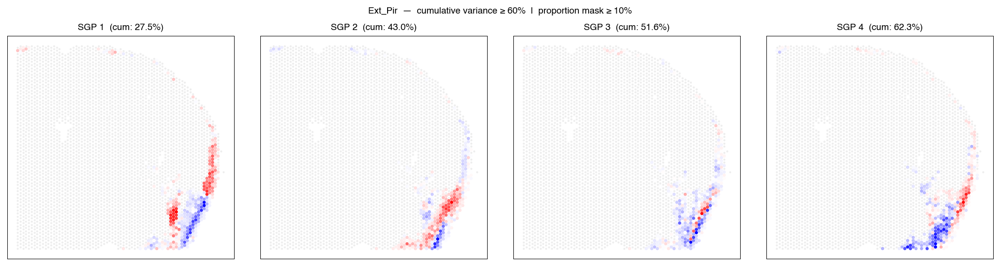

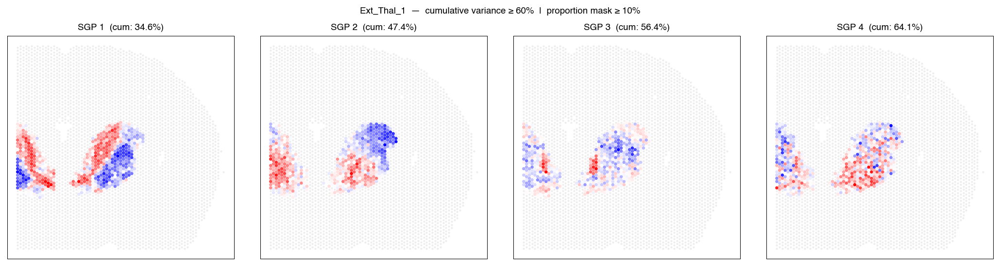

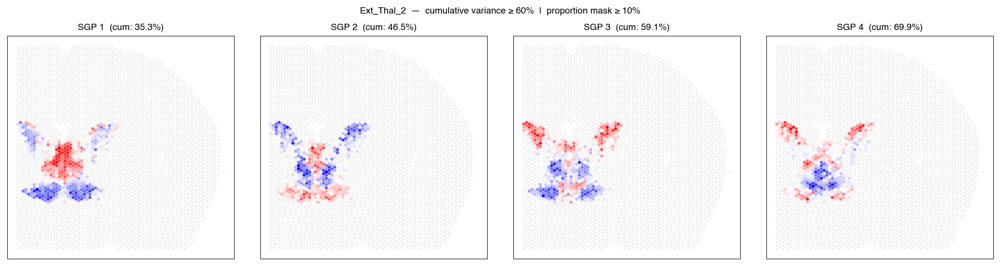

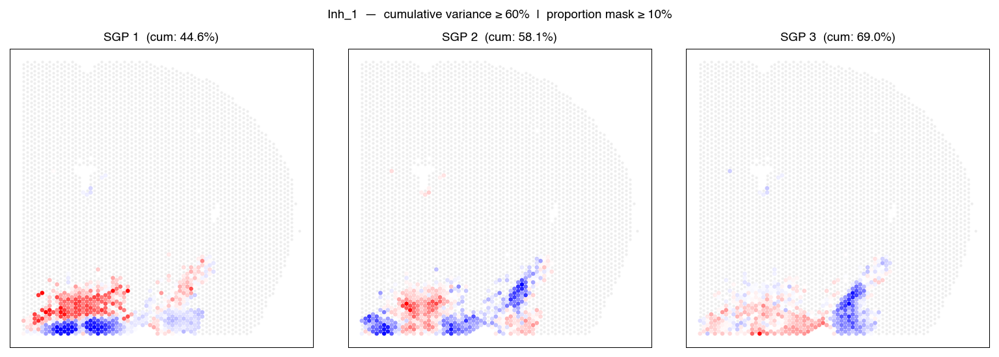

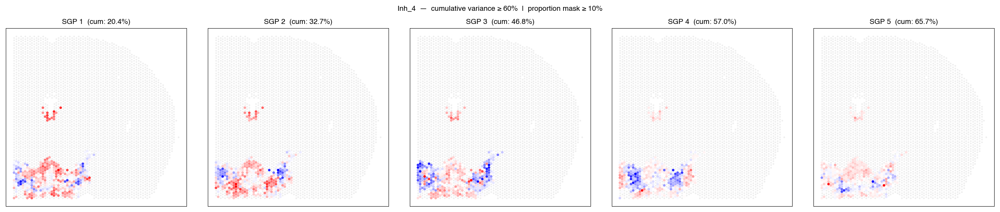

In [12]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl

# ============================================================
# 参数
# ============================================================
selected_cts   = ct_plot  # 自定义 cell type（需在 ct_plot 中）
cum_threshold  = 0.60         # 累计方差解释量阈值：画出达到该阈值所需的最少 SGPs
prop_threshold = 0.10        # proportion mask：低于此比例的 spot 显示为灰色背景

cmap_sgp = 'bwr'
s_vis    = 10   # 可见 spot 大小
s_masked = 4   # 被 mask 的 spot 大小

# ============================================================
# 每个 CT 达到阈值所需 SGP 数
# ============================================================
cum_variance_df = variance_explained_df.cumsum(axis=1)

n_sgps_needed = {}
for ct in selected_cts:
    row = cum_variance_df.loc[ct].values
    n_sgp = int(np.searchsorted(row, cum_threshold)) + 1
    n_sgps_needed[ct] = min(n_sgp, len(row))

spatial = adata_result.obsm["spatial"]

# ============================================================
# 每个 cell type 单独出一张图
# ============================================================
for ct in selected_cts:
    n_sgp   = n_sgps_needed[ct]
    cum_row = cum_variance_df.loc[ct].values

    prop = adata_result.obsm['proportion'][ct].to_numpy()
    mask = prop >= prop_threshold

    data = adata_result.obsm[ct].values   # (N, K)，factor_0 … factor_{K-1}

    fig, axes = plt.subplots(1, n_sgp,
                             figsize=(3.5 * n_sgp, 3.5),
                             squeeze=False)
    axes = axes[0]   # shape: (n_sgp,)

    for j in range(n_sgp):
        ax      = axes[j]
        values  = data[:, j]
        norm_ij = mpl.colors.TwoSlopeNorm(vcenter=0.0)

        ax.scatter(spatial[~mask, 0], spatial[~mask, 1],
                   c='lightgray', s=s_masked, alpha=0.4,
                   rasterized=True, linewidths=0)
        ax.scatter(spatial[mask, 0], spatial[mask, 1],
                   c=values[mask], s=s_vis, cmap=cmap_sgp,
                   norm=norm_ij, rasterized=False, linewidths=0)

        cum_pct = cum_row[j] * 100
        ax.set_title(f'SGP {j+1}  (cum: {cum_pct:.1f}%)', fontsize=9)
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_aspect('equal', adjustable='box')
        for spine in ax.spines.values():
            spine.set_linewidth(0.5)

    fig.suptitle(
        f'{ct}  —  cumulative variance ≥ {cum_threshold*100:.0f}%'
        f'  |  proportion mask ≥ {prop_threshold*100:.0f}%',
        fontsize=9, y=1.02
    )
    plt.tight_layout()
    plt.show()

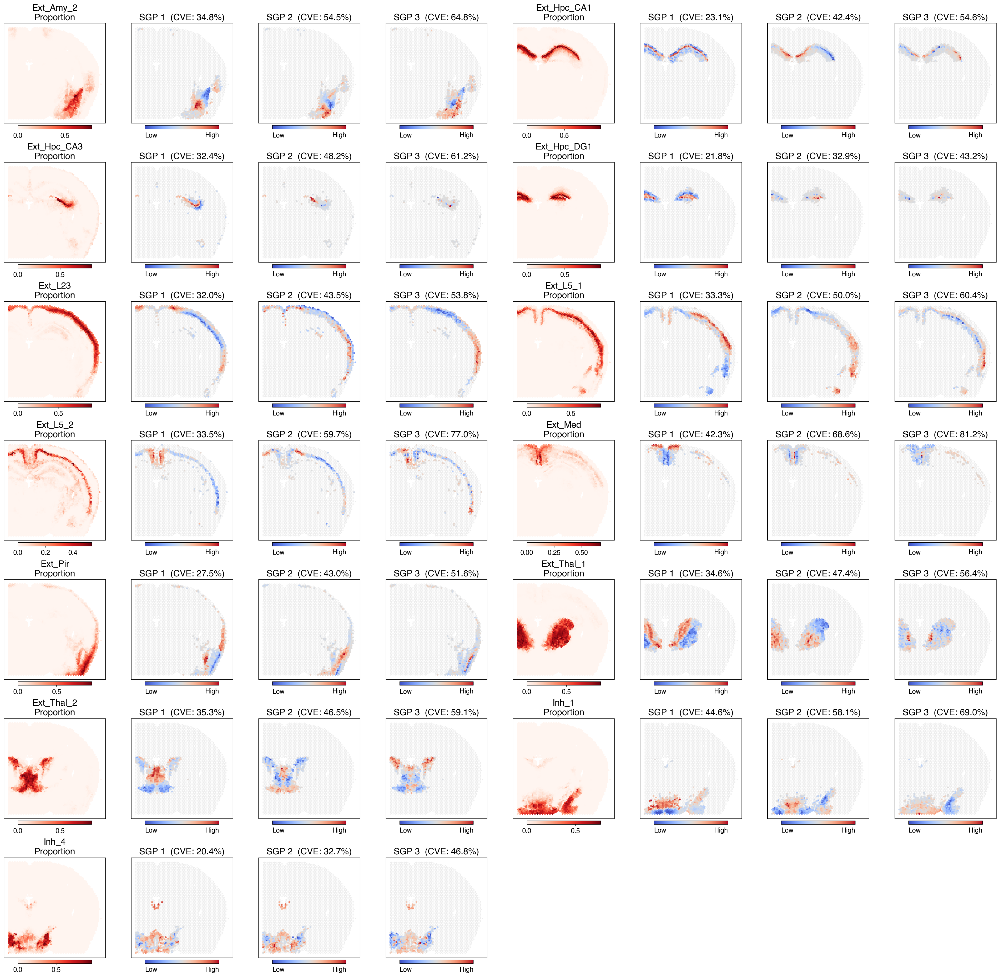

In [9]:
import math

# ============================================================
# 参数
# ============================================================
n_sgp          = 3
cols_per_ct    = n_sgp + 1        # proportion + SGP1..3
cts_per_row    = 2
prop_threshold = 0.1
cmap_sgp       = 'coolwarm'
cmap_prop      = 'Reds'
s_vis          = 10
s_masked       = 4

spatial = adata_result.obsm["spatial"]
cum_variance_df = variance_explained_df.cumsum(axis=1)
selected_cts = ct_plot

n_cts  = len(selected_cts)
n_rows = math.ceil(n_cts / cts_per_row)
n_cols = cols_per_ct * cts_per_row

fig, axes = plt.subplots(n_rows, n_cols,
                         figsize=(3.2 * n_cols, 3.5 * n_rows),
                         squeeze=False)

for i, ct in enumerate(selected_cts):
    row        = i // cts_per_row
    col_offset = (i % cts_per_row) * cols_per_ct
    cum_row    = cum_variance_df.loc[ct].values
    prop       = adata_result.obsm['proportion'][ct].to_numpy()
    mask       = prop >= prop_threshold
    data       = adata_result.obsm[ct].values

    # proportion 列
    ax0  = axes[row, col_offset]
    sca0 = ax0.scatter(spatial[:, 0], spatial[:, 1],
                       c=prop, s=s_vis, cmap=cmap_prop,
                       vmin=0, vmax=prop.max(),
                       rasterized=True, linewidths=0)
    cbar0 = fig.colorbar(sca0, ax=ax0, orientation='horizontal',
                         fraction=0.035, pad=0.02, shrink=0.6)
    cbar0.ax.tick_params(labelsize=12)
    ax0.set_title(f'{ct}\nProportion', fontsize=16)
    ax0.set_xticks([]); ax0.set_yticks([])
    ax0.set_aspect('equal', adjustable='box')
    for spine in ax0.spines.values():
        spine.set_linewidth(0.5)

    # SGP 列
    for j in range(n_sgp):
        ax      = axes[row, col_offset + j + 1]
        values  = data[:, j]
        norm_ij = mpl.colors.TwoSlopeNorm(vcenter=0.0)

        ax.scatter(spatial[~mask, 0], spatial[~mask, 1],
                   c='lightgray', s=s_masked, alpha=0.4,
                   rasterized=True, linewidths=0)
        sca_j = ax.scatter(spatial[mask, 0], spatial[mask, 1],
                           c=values[mask], s=s_vis, cmap=cmap_sgp,
                           norm=norm_ij, rasterized=True, linewidths=0)

        cbar_j = fig.colorbar(sca_j, ax=ax, orientation='horizontal',
                              fraction=0.035, pad=0.02, shrink=0.6)
        cbar_j.set_ticks([])
        cbar_j.ax.text(0.0, -0.8, 'Low',  ha='left',  va='top', fontsize=12,
                       transform=cbar_j.ax.transAxes)
        cbar_j.ax.text(1.0, -0.8, 'High', ha='right', va='top', fontsize=12,
                       transform=cbar_j.ax.transAxes)

        cum_pct = cum_row[j] * 100
        ax.set_title(f'SGP {j+1}  (CVE: {cum_pct:.1f}%)', fontsize=16)
        ax.set_xticks([]); ax.set_yticks([])
        ax.set_aspect('equal', adjustable='box')
        for spine in ax.spines.values():
            spine.set_linewidth(0.5)

# 隐藏多余的空白轴（cell type 数为奇数时）
for i in range(n_cts, n_rows * cts_per_row):
    row        = i // cts_per_row
    col_offset = (i % cts_per_row) * cols_per_ct
    for j in range(cols_per_ct):
        axes[row, col_offset + j].set_visible(False)

plt.subplots_adjust(wspace=0.05, hspace=0.3)
plt.tight_layout()
plt.savefig(f'all_cts_top{n_sgp}_spatial.png', dpi=300, bbox_inches='tight')
plt.show()
